# Setup

Retrieve "GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv" from [this GitHub link](https://github.com/nasa/GeneLab_Data_Processing/blob/master/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files/GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv) and save it in the same directory as this notebook. The GitHub path is `nasa/GeneLab_Data_Processing/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files`.

While in the folder containing this notebook:
`conda env create -f rapidsc.yml`

Navigate back to where you want to clone the `scflow` repository (I recommend home)
`cd`

Clone `scflow` from GitHub.
`git clone git@github.com:easlinger/scflow.git`

Navigate to the folder where `scflow` is:
`pip install .`

`pip install senepy`

---

Download and install SRA-Tools and CellRanger.

---

Run the following, changing `/home/easlinger/data/` to your path to the repository data sub-directory and `fasterq-dump -e 28 -m 8G` and `pigz -p 28` according to how many cores and how much memory you want to use:

```
# Set your base directory for FASTQs
BASE_DIR=~/home/easlinger/data/PRJNA922998
mkdir -p $BASE_DIR
mkdir -p $BASE_DIR/fastqs
SRRS=(SRR23052428 SRR23052429)  # add more as needed

# Loop over each run
cd $BASE_DIR
for SRR in "${SRRS[@]}"; do
    prefetch --max-size 50G $SRR
    fasterq-dump -e 28 -m 8G -p --split-files $SRR -O $BASE_DIR
    pigz -p 28 ${SRR}_*.fastq
    mv $BASE_DIR/${SRR}_1.fastq.gz $BASE_DIR/fastqs/${SRR}_S1_L001_R1_001.fastq.gz
    mv $BASE_DIR/${SRR}_2.fastq.gz $BASE_DIR/fastqs/${SRR}_S1_L001_R2_001.fastq.gz
done
```

Then run CellRanger, changing `--localcores` and `--localmem` arguments according to your system resources:

```
```

---

**Older Script**

Run the following code to get the data from the online repository (replace `/home/easlinger/data/` with the path to the data):

```
# Make & Navigate to Directory
mdkir /home/easlinger/data/PRJNA922998
cd /home/easlinger/data/PRJNA922998

# Fetch SRAs & Make Sub-Directories
prefetch --max-size 50G SRR23052428
prefetch --max-size 50G SRR23052429 
mkdir fastqs
```

Run this code to structure the data//convert it to the proper format (change `-e 28 -m 8G` according to how many cores you want to use):

```
# SRA => FASTQ
fasterq-dump --split-files --progress /home/easlinger/data/PRJNA922998/SRR23052428 -e 28 -m 8G
fasterq-dump --split-files --progress /home/easlinger/data/PRJNA922998/SRR23052429 -e 28 -m 8G

# Rename Conventionally
mv SRR23052428_1.fastq SRR23052428_S1_L001_R1_001.fastq
mv SRR23052428_2.fastq SRR23052428_S1_L001_R2_001.fastq
mv SRR23052429_1.fastq SRR23052429_S1_L001_R1_001.fastq
mv SRR23052429_2.fastq SRR23052429_S1_L001_R2_001.fastq
```

Zip the files and remove redundant ones (use, e.g., `` instead of `gzip` for faster process using 28 cores):

```
# Zip SRR23052428 FASTQs
cd SRR23052428
gzip *.fastq
mv *.fastq.gz fastqs
cd ..

# Zip SRR23052429 FASTQs
pigz -p 28 *.fastq
mv *.fastq.gz fastqs

# Remove SRAs
rm SRR23052428/SRR23052428.sra
rm SRR23052429/SRR23052429.sra
```

Download reference data from [here](https://www.10xgenomics.com/support/software/cell-ranger/downloads#reference-downloads) and use `tar -xzvf refdata-gex-GRCm39-2024-A.tar.gz` (replace file name if needed) to unzip.

---

Run CellRanger (**change `--localcores=16 --localmem=64` to fit your computer's or cluster's resources**):

```
BASE_DIR=/home/easlinger/data/data/PRJNA922998/fastqs
TRANSCRIPTOME=/home/easlinger/data/reference_genomes/refdata-gex-GRCm39-2024-A
SRRS=(SRR23052428 SRR23052429)  # add more SRRs here
ARCHIVE=/home/easlinger/data/PRJNA922998/archive
mkdir $ARCHIVE
for SRR in "${SRRS[@]}"; do
    mv $SRR $ARCHIVE
    cellranger count --id=$SRR \
      --transcriptome=$TRANSCRIPTOME \
      --fastqs=$BASE_DIR \
      --sample=$SRR \
      --localcores=28 \
      --localmem=64 \
      --create-bam=false &
done
wait
echo "All Cell Ranger counts completed."
```

## Imports & Display

In [9]:
%load_ext autoreload
%autoreload 2
%xmode plain

import os
import re
import logging
import warnings
import json
try:
    import torch
    torch.set_float32_matmul_precision("medium")
except Exception:
    pass
# try:
#     import rapids_singlecell as rsc
# except Exception:
#     rsc = None
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from pandas.errors import PerformanceWarning
import pandas as pd
import numpy as np
import scflow

pd.set_option("display.max_rows", 500)  # or None for unlimited rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 200)




class CategoricalFilter(logging.Filter):
    def filter(self, record):
        msg = record.getMessage()
        # suppress "storing ... as categorical" logs
        if "storing" in msg and "as categorical" in msg:
            return False
        # suppress DataFrame fragmentation warnings
        if "DataFrame is highly fragmented" in msg:
            return False
        return True

# Apply to root logger (or your logger of choice)
logging.getLogger().addFilter(CategoricalFilter())
warnings.simplefilter("ignore", PerformanceWarning)
logger = logging.getLogger("anndata")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Exception reporting mode: Plain


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):


## Set Options (ACTIVELY SET THESE!)

In [ ]:
# Processors to Use
n_processors = os.cpu_count() - 1  # how many processors to use

# If You Want Results Emailed
cur_file = os.path.join(os.path.abspath(""), "create_object_612.ipynb")
html_out = os.path.splitext(cur_file)[0] + ".html"
email = "elizabeth.aslinger@aya.yale.edu"
# set email to None to skip

# Set Sample & Batch IDs, Plus Other Potential Sources of Batch Effects
col_condition = "Condition"
col_sample = "sample"
col_batch = col_condition
covariates_categorical = None
covariates_continuous = None

# Set Data Sources & Species
species = "Mouse"
metadata = pd.DataFrame({col_sample: ["SRR23052428", "SRR23052429"],
                         col_condition: [
                             "Irradiated", "Control"]}).set_index(col_sample)
batches = list(metadata.index.values)

# Set Source Data Directory & Output Options
superdirec = "/home/easlinger/data/PRJNA922998"  # directory with data
files = dict(zip(batches, [os.path.join(
    superdirec, i, "outs/filtered_feature_bc_matrix") for i in batches]))
# new h5ad will write to "data" sub-directory of where this notebook is
overwrite = True  # allow overwrite of files?
file_concat = os.path.join("data", f"{'_'.join(batches)}_concatenated.h5ad")
file_new = os.path.join("data", f"{'_'.join(batches)}_integrated.h5ad")

# Do Sub-Clustering?
subcluster_biggest = 1
kws_cluster = dict(n_comps=50)  # cluster individual samples
vars_regress_out = None

# Set Annotation Sources
map_my_cells_source = "WMB-10X" if species == "Mouse" else "WHB-10X" if (
    species == "Human") else None  # Map My Cells atlas source
# map_my_cells_region_keys = None
map_my_cells_region_keys = [
    "RSP", "ACA", "PL-ILA-ORB", "AUD-TEa-PERI-ECT", "SS-GU-VISC", "MO-FRP",
    "AI", "VIS-PTLp", "VIS", "MOp", "AUD", "SSp",
    "TEa-PERI-ECT"]  # regional subset for Map My Cells
map_my_cells_cell_keys = ["Isocortex"]  # pattern match: feature name column
if species == "Mouse":
    model_celltypist = "Mouse_Whole_Brain.pkl"
else:
    raise ValueError("Manually set CellTypist model for non-mouse!")
source_patterns = ["Brain", "Cortical", "cortex"]  # for ToppGene

# Make Pre-Defined Marker Dictionary
cts_superhierarchical = {
    "Neuron": ["Excitatory", "Inhibitory", "Glutamatergic", "GABAergic",
               "Dopaminergic", "Serotonergic", "Cholinergic"]
}  # if classified as Neuron + other, just keep more specific type(s)
rename_marker_based_annotation = {
    "Excitatory | Inhibitory": "Excitatory-Inhibitory",
    "Inhibitory | Inhibitory": "Excitatory-Inhibitory"
}
mks_a_priori = pd.read_csv("GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv")
mks_a_priori.loc[:, "cellName"] = mks_a_priori.cellName.replace({
    "Oligodendrocyte precursor cell": "OPC"}).apply(
        lambda x: " ".join([i.capitalize() for i in re.sub(
            " cell", "", x).split(" ")])).replace({
                "Opc": "OPC"})  # capitalize cell names
mks_a_priori = mks_a_priori.set_index("cellName")["geneSymbol"]
mks_a_priori = dict(mks_a_priori.apply(lambda x: set(x.split(","))))
mks_a_priori.update({
    "Neuroepithelial": {"Nes", "Notch1", "Sox2", "Sox10", "Hes1", "Hes3"},
    "Excitatory": {"Slc17a7", "Slc30a3", "Tcf4",
                   "Slc17a6", "Slc6a1", "Baiap3",
                   "Grin1", "Grin2b", "Gls"},
    "Inhibitory": {"Gad1", "Slc6a1", "Gabbr1", "Gabbr2",
                   "Gad2", "Slc32a1", "Oprm1", "Htr2c"},
    # "Glutamatergic": {"Slc17a7", "Slc17a6", "Grin1", "Grin2b", "Gls"},
    # "GABAergic": {"Slc6a1", "Gabbr1", "Gabbr2", "Gad2", "Gad1"},
    # "Dopaminergic": {"Th", "Dat", "Foxa2", "Girk2", "Nurr1", "Lmx1b"},
    # "Serotonergic": {"Tph", "Sert", "Pet1"},
    # "Cholinergic": {"ChAT", "VAChT", "Acetylcholinesterase"}
})
markers_predefined = {**mks_a_priori}
if cts_superhierarchical is not None:
    for i in cts_superhierarchical:
        for k in [u for u in cts_superhierarchical[
                i] if u in markers_predefined]:
            markers_predefined[k] = markers_predefined[k].union(
                markers_predefined[i])
    _ = [markers_predefined.pop(i) for i in cts_superhierarchical]
mks_collapsed = {**mks_a_priori}
mks_collapsed["Neuron"] = mks_collapsed["Neuron"].union(mks_collapsed[
    "Excitatory"]).union(mks_collapsed["Inhibitory"])
_ = mks_collapsed.pop("Excitatory")
_ = mks_collapsed.pop("Inhibitory")

## Load Individual Sample Data

In [11]:
%%time

# Create a Subdirectory of Working Directory for Data Outputs
os.makedirs("data", exist_ok=True)
adatas = dict(zip(files, [sc.read_10x_mtx(files[i]) for i in files]))
for x in adatas:
    print(f"{x}\n\n")
    adatas[x].obs[col_sample] = x
    adatas[x].obs["n_cells_original_sample"] = adatas[x].obs.shape[0]
    for i in metadata:
        adatas[x].obs[i] = metadata.loc[x, i]
    print(adatas[x].obs.head())
    print(adatas[x])

SRR23052428


                         sample  n_cells_original_sample   Condition
AAACCCAAGAGTTCGG-1  SRR23052428                    22119  Irradiated
AAACCCAAGATTGTGA-1  SRR23052428                    22119  Irradiated
AAACCCAAGTGCCAGA-1  SRR23052428                    22119  Irradiated
AAACCCAAGTGCCTCG-1  SRR23052428                    22119  Irradiated
AAACCCAAGTTGAATG-1  SRR23052428                    22119  Irradiated
AnnData object with n_obs × n_vars = 22119 × 33696
    obs: 'sample', 'n_cells_original_sample', 'Condition'
    var: 'gene_ids', 'feature_types'
SRR23052429


                         sample  n_cells_original_sample Condition
AAACCCAAGACGATAT-1  SRR23052429                    15125   Control
AAACCCAAGCGATGAC-1  SRR23052429                    15125   Control
AAACCCAAGTTAGAAC-1  SRR23052429                    15125   Control
AAACCCACACTCAAGT-1  SRR23052429                    15125   Control
AAACCCACAGATTAAG-1  SRR23052429                    15125   Control
AnnData ob

# QC

## Perform Sample-Specific QC

Variable                       n_cells_by_counts  n_genes_by_counts  pct_counts_mt  total_counts
sample      Condition  Metric                                                                   
SRR23052428 Irradiated count             33696.0            22119.0        22119.0       22119.0
                       mean                967.0             1474.0            1.0        3424.0
                       std                1938.0             1152.0            2.0        5311.0
                       min                   0.0              313.0            0.0         500.0
                       2.5%                  0.0              426.0            0.0         581.0
                       10%                   0.0              527.0            0.0         773.0
                       25%                   2.0              717.0            0.0        1146.0
                       50%                  73.0             1110.0            0.0        1917.0
                       75%                1042.0             1807.0            0.0        3609.0
                       85%                2120.0             2409.0            1.0        5460.0
                       90%                3094.0             2931.0            1.0        7254.0
                       97.5%              6913.0             4511.0            6.0       15103.0
                       max               22119.0            12311.0           22.0      149143.0
SRR23052429 Control    count             33696.0            15125.0        15125.0       15125.0
                       mean                610.0             1359.0            0.0        3282.0
                       std                1195.0             1150.0            2.0        4537.0
                       min                   0.0              228.0            0.0         500.0
                       2.5%                  0.0              325.0            0.0         531.0
                       10%                   0.0              394.0            0.0         643.0
                       25%                   1.0              537.0            0.0         921.0
                       50%                  51.0              958.0            0.0        1724.0
                       75%                 674.0             1736.0            0.0        3529.0
                       85%                1356.0             2438.0            0.0        5588.0
                       90%                1970.0             3022.0            1.0        7744.0
                       97.5%              4257.0             4525.0            2.0       16134.0
                       max               15125.0            10468.0           36.0      112874.0

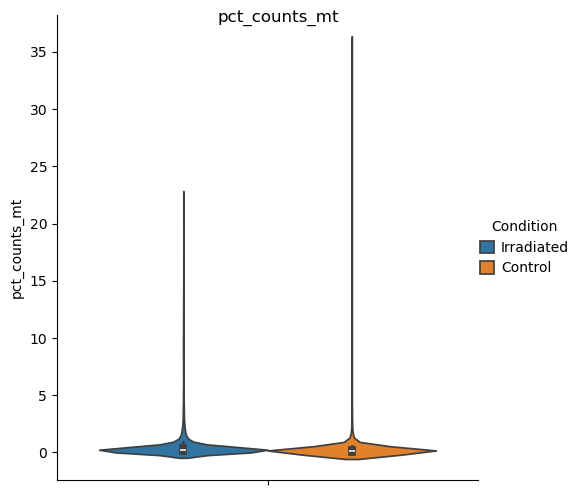

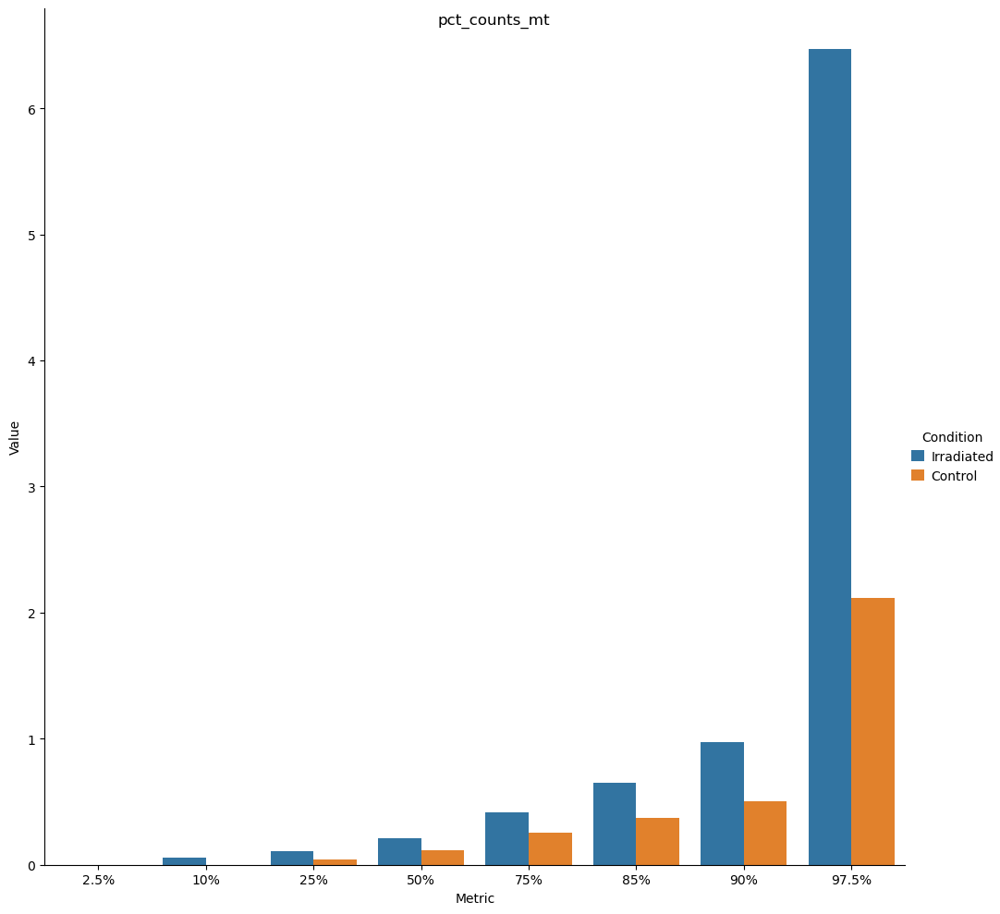

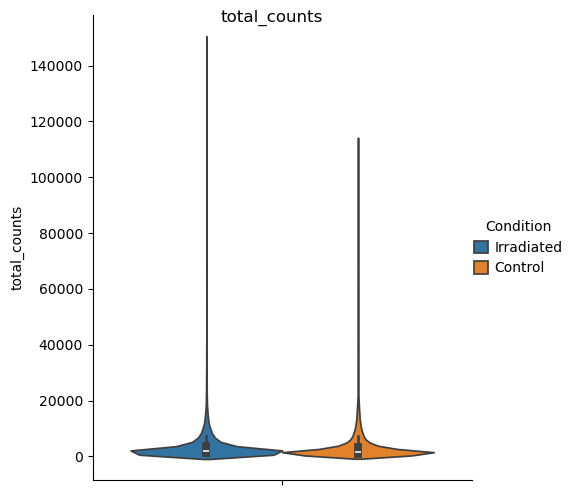

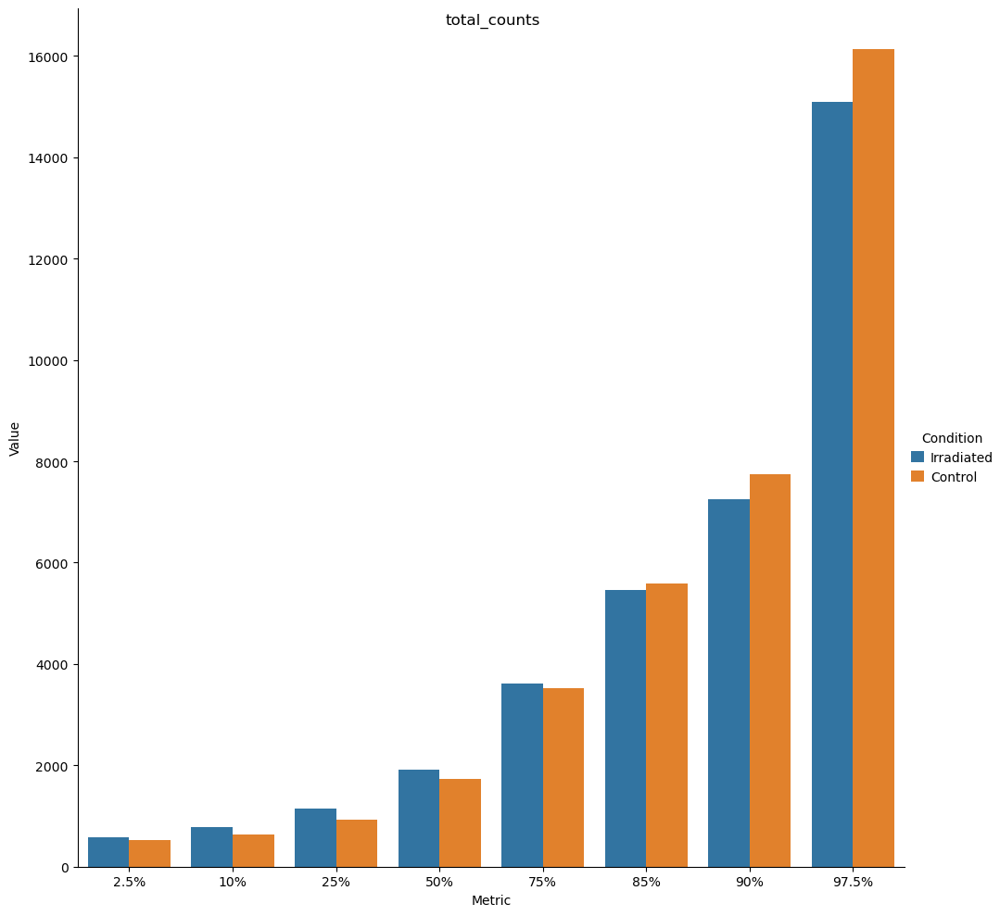

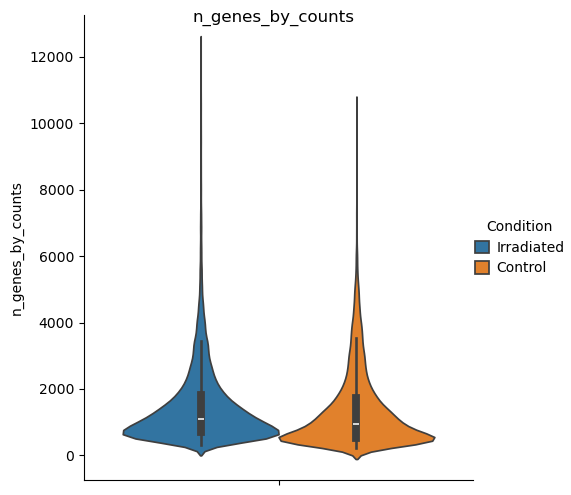

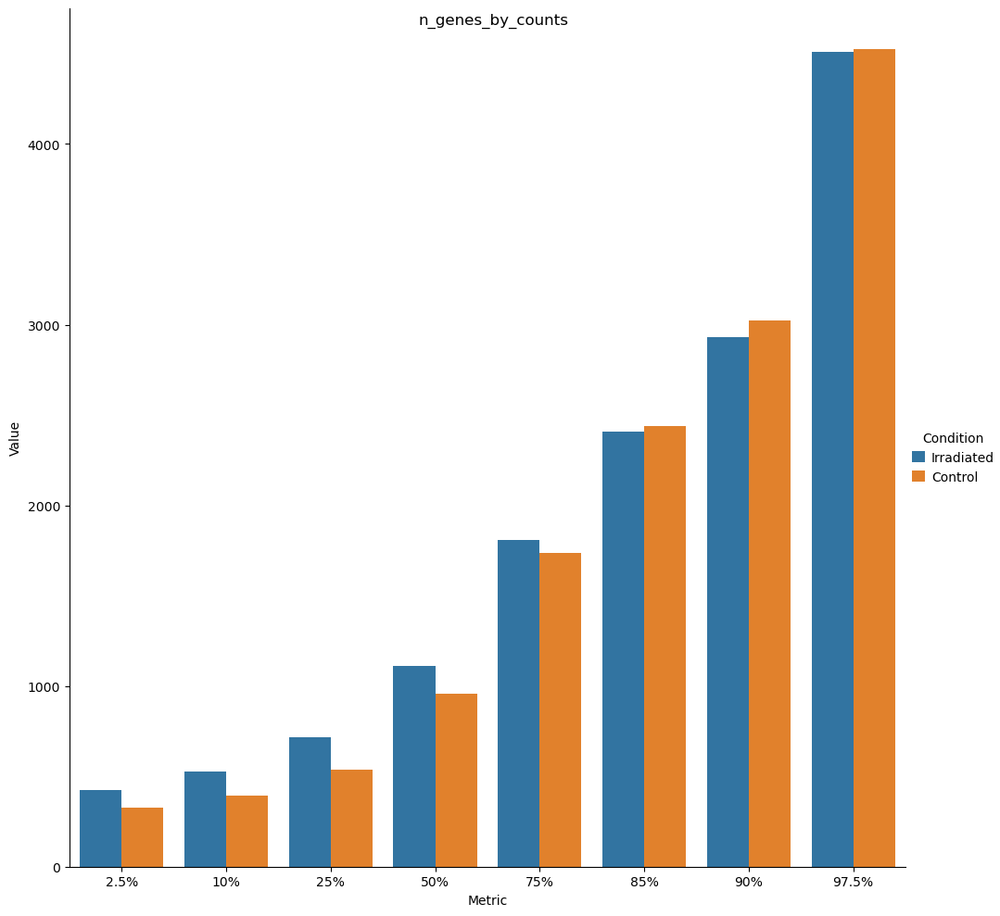

In [12]:
%matplotlib inline

plot_qc = False  # change to True to get sample-level QC plots (a bit slow)
qcs, n_cells_by_counts, descriptives, figs = scflow.pp.perform_qc_multi(
    adatas, col_batch=col_batch, col_sample=col_sample, plot=plot_qc,
    percentiles=[0.025, 0.10, 0.25, 0.50, 0.75, 0.85, 0.90, 0.975],
    figsize=(10, 10))  # perform QC on individual samples
for x in qcs:  # iterate QC metrics % plot percentiles by group
    fig = sns.catplot(qcs, y=x, hue=col_batch, kind="violin")
    fig.fig.suptitle(x)
    fig = sns.catplot(descriptives.loc[:, :, x][[
        i for i in descriptives if ("%" in i)]].stack().to_frame("Value"),
                      x="Metric", y="Value", kind="bar",
                      hue=col_batch, height=10)
    fig.fig.suptitle(x)
descriptives.stack().unstack("Variable").round()

## Auto-Detect Filtering Thresholds

Use 2.5th and/& 97.5th percentile (sample-specific) as minimum genes per cell and minimum and maximum total counts (subject to specified absolute minima). Use 97.5th percentile as upper bound for percent mitochondrial count. 

Use an absolute minimum cells per gene.

Also include arguments to run a PCA on individual samples before integrating.

To preview the effect of setting different absolute minima/maxima, use code such as the following to see how much data may be dropped:

```
descriptives.stack().unstack("Variable")["n_genes_by_counts"].loc[:, :, "85%", :]
descriptives.stack().unstack("Variable")["pct_mt"].loc[:, :, "85%", :]
descriptives.stack().unstack("Variable")["total_counts"].loc[:, :, "90%", :]
descriptives.stack().unstack("Variable")["total_counts"].loc[:, :, "10%", :]
descriptives.stack().unstack("Variable")["n_cells_by_counts"].loc[:, :, "10%", :]
```

In [13]:
# Options
bounds = descriptives[["2.5%", "97.5%"]].apply(lambda x: list(
    x), axis=1).unstack("Variable")  # list top/bottom 5% (~sample, variable)
abs_min_cells = 3  # regardless of %ile, minimum cells to retain gene
abs_min_genes = 200  # regardless of %ile, minimum genes to retain cell
abs_min_count = 300  # regardless of %ile, minimum counts to retain cell
abs_max_mt = 5  # regardless of %ile, absolute maximum mitochonrial content
n_top_genes = 2000  # number of top genes to count as HVGs

# Set Thresholds
kws_pp = {}
for x in adatas:
    b_x = bounds.loc[x]
    b_counts =  b_x["total_counts"] if isinstance(b_x[
            "total_counts"], list) else b_x["total_counts"].iloc[0]
    b_counts = [max(b_counts[0], abs_min_count), b_counts[1]]
    kws_pp[x] = {
        "min_max_genes": [round(i) if i else i for i in [max((b_x[
            "n_genes_by_counts"] if isinstance(b_x[
                "n_genes_by_counts"], list) else b_x[
                    "n_genes_by_counts"].iloc[0])[0], abs_min_genes), None]],
        "min_max_cells": [round(abs_min_cells), None],
        # "min_max_cells": [max((b_x["n_cells_by_counts"] if isinstance(
        #     b_x["n_genes_by_counts"], list) else b_x[
        #         "n_genes_by_counts"].iloc[0])[0], abs_min_cells), None],
        # "max_mt": min(abs_max_mt, (b_x["pct_counts_mt"] if isinstance(b_x[
        #     "pct_counts_mt"], list) else b_x["pct_counts_mt"].iloc[0])[1]),
        "max_mt": abs_max_mt,
        "min_max_counts": [round(i) if i else i for i in b_counts],
        # "vars_regress_out": ["total_counts"],
        "target_sum": 1e4,
        "zero_center": True, "max_value": 10,  # scaling
        "n_top_genes": n_top_genes,
        "doublet_detection": "drop"
    }
print("\n".join([f"{s}: {kws_pp[s]}" for s in kws_pp]))
pd.DataFrame(kws_pp).T

SRR23052428: {'min_max_genes': [426, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [581, 15103], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
SRR23052429: {'min_max_genes': [325, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [531, 16134], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}


,min_max_genes,min_max_cells,max_mt,min_max_counts,target_sum,zero_center,max_value,n_top_genes,doublet_detection
SRR23052428,"[426, None]","[3, None]",5,"[581, 15103]",10000.0,True,10,2000,drop
SRR23052429,"[325, None]","[3, None]",5,"[531, 16134]",10000.0,True,10,2000,drop


# Integrate

## Preprocess Individual

### Filter & Normalize

In [14]:
# Preprocess
if overwrite is False and os.path.exists(pfp):
    raise ValueError("Must be able to overwrite to use on-disk option")
files_individual = dict(zip(files.keys(), [os.path.join(
    "data", f"{x}_processed.h5ad") for x in files]))  # new individual files
var_names = []  # to store genes not filtered out for each sample
for x in files:  # iterate sample files
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}")
    adatas[x].obs.loc[:, f"kws_pp_{col_sample}"] = str(kws_pp[x])  # store kws
    adatas[x] = scflow.pp.preprocess(
        adatas[x], **kws_pp[x], plot_qc=False)  # preprocess data
    var_names += [set(adatas[x].var_names)]  # track what genes still present

# Decide Join Method
shared_genes = set.intersection(*var_names)  # genes in all after filtering
all_genes = set.union(*var_names)  # genes in any post-filter sample
print(f"{len(shared_genes)} genes present in all samples post-filtering (out"
      f" of {len(all_genes)} total genes present in any post-filter sample)")
join_method = "inner" if len(shared_genes) / len(all_genes) >= 0.5 else \
    "outer"  # outer join if <1/2 of genes shared across all samples

# Show Number of Cells Pre- & Post-Filtering
n_cells = pd.concat([pd.Series([
    adatas[x].obs.shape[0] for x in adatas], index=adatas).to_frame(
        "N Cells"), pd.Series([adatas[x].obs["n_cells_original_sample"].iloc[
            0] for x in adatas], index=adatas).to_frame(
                "N Cells Original")], axis=1)
n_cells = n_cells.assign(Percent_Dropped=100 * (1 - n_cells[
    "N Cells"] / n_cells["N Cells Original"]))
n_cells



SRR23052428
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 22119 × 33696
    obs: 'sample', 'n_cells_original_sample', 'Condition', 'kws_pp_sample', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'log1p_total_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'
    layers: 'counts'
	***Filtering cells by counts...
	***Filtering cells by genes...
filtered out 205 cells that have less than 426 genes expressed
	***Filtering genes by cells...
filtered out 9366 genes that are detected in less than 3 cells
	***Filtering cells by mitochondrial gene content...
	***Performing doublet detection...


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.13
Detected doublet rate = 13.1%
Estimated detectable doublet fraction = 52.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 24.9%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


SRR23052429
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 15125 × 33696
    obs: 'sample', 'n_cells_original_sample', 'Condition', 'kws_pp_sample', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'log1p_total_counts_hb'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'
    layers: 'counts'
	***Filtering cells by counts...
	***Filtering cells by genes...
filtered out 220 cells

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.59
Detected doublet rate = 0.0%
Estimated detectable doublet fraction = 0.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.0%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
23253 genes present in all samples post-filtering (out of 24903 total genes present in any post-filter sample)


,N Cells,N Cells Original,Percent_Dropped
SRR23052428,17525,22119,20.769474
SRR23052429,13921,15125,7.960331


### Test Preprocessing

Unit tests

In [15]:
for p, ann in zip([kws_pp[x] for x in kws_pp], [adatas[x] for x in adatas]):
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}\n")
    if join_method == "inner":
        assert all(ann.var["n_cells_by_counts"] >= p["min_max_cells"][0])
        assert all(ann.var["n_cells_by_counts"] <= p[
            x]["min_max_cells"][1]) if kws_pp[x]["min_max_cells"][1] else True
    assert all(ann.obs["n_genes_by_counts"] >= p["min_max_genes"][0])
    assert all(ann.obs["n_genes_by_counts"] <= p[
        "min_max_genes"][1]) if p["min_max_genes"][1] else True
    assert all(ann.obs["pct_counts_mt"] <= p["max_mt"])
    assert all(ann.obs["total_counts"] >= p["min_max_counts"][0])
    assert all(ann.obs["total_counts"] <= p["min_max_counts"][1]) if (
        p["min_max_counts"][1]) else True
    print(p)
    print(ann.obs[["n_genes", "pct_counts_mt", "total_counts"]
                  ].describe().loc[["min", "max"]])
    print(ann.var[["n_cells_by_counts"]].describe().loc[[
        "min", "max"]])



SRR23052429

{'min_max_genes': [426, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [581, 15103], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
     n_genes  pct_counts_mt  total_counts
min    426.0        0.00000         581.0
max   5103.0        4.98008       15102.0
     n_cells_by_counts
min                3.0
max            22119.0


SRR23052429

{'min_max_genes': [325, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [531, 16134], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
     n_genes  pct_counts_mt  total_counts
min    325.0       0.000000         531.0
max   5829.0       4.912573       16121.0
     n_cells_by_counts
min                3.0
max            15125.0


## Cluster Individual



SRR23052428
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1...
	***Performing Leiden clustering with resolution 0.15...


... storing 'sample' as categorical
... storing 'Condition' as categorical
... storing 'kws_pp_sample' as categorical
... storing 'feature_types' as categorical


['Pericyte', 'Excitatory-Inhibitory', 'Astrocyte', 'OPC', 'Oligodendrocyte', 'Endothelial', 'Microglial', 'Inhibitory']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 0.15...
	***Performing Leiden clustering with resolution 0.15...
['Pericyte', 'Oligodendrocyte', 'Inhibitory', 'Astrocyte', 'OPC', 'Endothelial', 'Excitatory', 'Microglial']
{'resolution': 0.15, 'min_dist': 0.15, 'n_comps': 50}


SRR23052429
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1...
	***Performing Leiden clustering with resolution 0.15...


... storing 'sample' as categorical
... storing 'Condition' as categorical
... storing 'kws_pp_sample' as categorical
... storing 'feature_types' as categorical


['Excitatory', 'Microglial', 'Pericyte', 'Oligodendrocyte', 'Inhibitory', 'Astrocyte', 'Endothelial', 'Excitatory-Inhibitory', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 0.15...
	***Performing Leiden clustering with resolution 0.15...


... storing 'kws_cluster_individual' as categorical


['Excitatory', 'Microglial', 'Pericyte', 'Oligodendrocyte', 'Inhibitory', 'Astrocyte', 'Endothelial', 'OPC']
{'resolution': 0.15, 'min_dist': 0.15, 'n_comps': 50}
No Valid Clustering Scheme Yet: []


SRR23052428

AnnData object with n_obs × n_vars = 17525 × 24330
    obs: 'sample', 'n_cells_original_sample', 'Condition', 'kws_pp_sample', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'log1p_total_counts_hb', 'n_counts', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_individual_res0.15dist0.15', 'annotation_by_markers_individual_res0.15dist0.15', 'annotation_by_markers_individual_heterogeneous_collapsed', 'leiden_individual', 'annotation_by_markers_individual', 'kws_cluster_individual'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'total_counts'

... storing 'kws_cluster_individual' as categorical




SRR23052429

AnnData object with n_obs × n_vars = 13921 × 23826
    obs: 'sample', 'n_cells_original_sample', 'Condition', 'kws_pp_sample', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'log1p_total_counts_hb', 'n_counts', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_individual_res0.15dist0.15', 'annotation_by_markers_individual_res0.15dist0.15', 'annotation_by_markers_individual_heterogeneous_collapsed', 'leiden_individual', 'annotation_by_markers_individual', 'kws_cluster_individual'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'scr

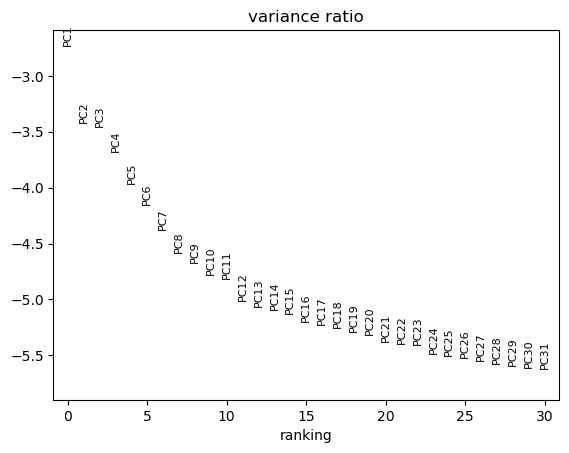

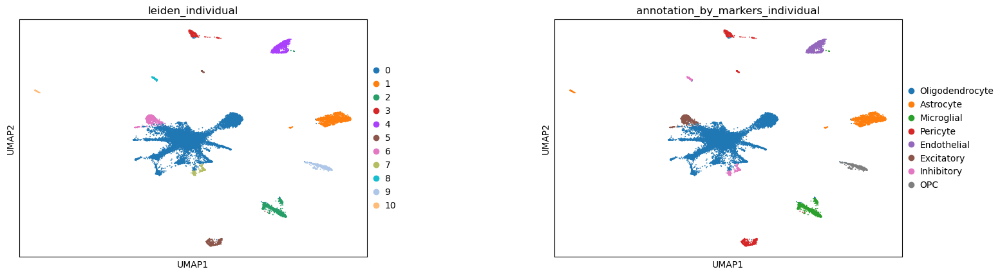

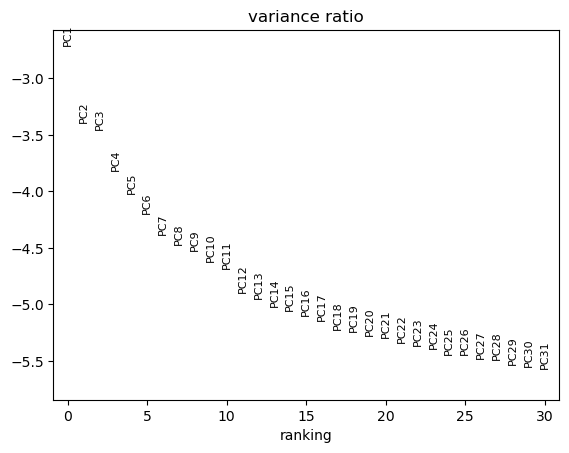

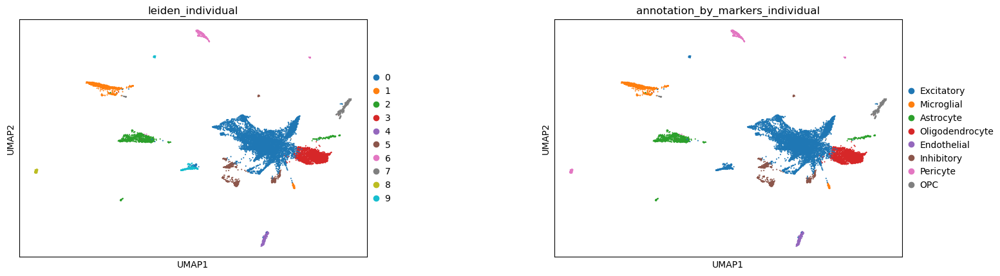

In [16]:
# Marker Dictionary for Annotation + Required & Prohibited Cell Types
use_mks = {**markers_predefined}
# use_mks = {**mks_collapsed}
cts_nonneuron = ["OPC", "Oligodendrocyte", "Astrocyte", "Microglial"]
req_cts = list(["Neuron"] if "Neuron" in use_mks else [
    "Excitatory", "Inhibitory"] ) + cts_nonneuron  # required cell types
prohib_cts = ["Excitatory-Inhibitory"]  # prohibited cell types

# Clustering Parameters
# resn_list = [0.2, 0.15, 0.5, 0.1, 0.075,  0.3, 0.25, 0.4]
# dist_list = [1, 0.5, 0.75, 1.5, 0.3, 0.4]
# resn_list = [0.15, 0.2, 1, 1.5]
# dist_list = [1, 1.5, 0.5, 0.15]
resn_list = [0.15, 0.2, 1, 1.5]
dist_list = [1, 0.15, 0.5, 1.5]

# Column Names  & Heterogeneous Cell Type Key/Separator
col_cluster_individual = "annotation_by_markers_individual"
unlabeled_cat = "Heterogeneous"  # if can't find one best-fit cell label
cci_scanvi = col_cluster_individual + "_heterogeneous_collapsed"
sep = " | "  # separator for heterogeneous annotations

# Clustering
for x in files:  # iterate sample files
    valid_cts = False
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}")
    for r in resn_list:
        if valid_cts is True:
            break
        for t in dist_list:
            if valid_cts is True:
                break
            c_i = f"leiden_individual_res{r}dist{t}"
            cai = f"{col_cluster_individual}_res{r}dist{t}"
            kws_cl = {"resolution": r, "min_dist": t, **kws_cluster}
            adatas[x] = scflow.pp.cluster(
                adatas[x], plot=False, col_celltype=c_i, **kws_cl)
            sc.tl.rank_genes_groups(
                adatas[x], c_i, n_genes=None,
                key_added=f"rank_genes_groups_{c_i}",
                copy=False)  # find markers/DEGs
            _, adatas[x] = scflow.pp.annotate_by_marker_overlap(
                adatas[x], use_mks,
                col_celltype=c_i, col_celltype_new=cai, sep=sep,
                celltypes_superhierarchical=cts_superhierarchical,
                # top_n_markers=20,
                adj_pval_threshold=1e-15,
                method="overlap_coef", inplace=True)  # annotate
            if rename_marker_based_annotation is not None:
                adatas[x].obs.loc[:, cai] = adatas[x].obs[cai].replace(
                        rename_marker_based_annotation)  # re-name
            print(list(adatas[x].obs[cai].unique()))
            adatas[x].obs.loc[:, cci_scanvi] = adatas[x].obs[
                cai].apply(lambda x: unlabeled_cat if (sep in x) else x)
            valid_cts = all([q in adatas[x].obs[cai].unique()
                             for q in req_cts])
            valid_cts = valid_cts and (all([q not in adatas[x].obs[
                cai].unique() for q in prohib_cts]))
            valid_cts = False if any(adatas[x].obs[
                cci_scanvi] == unlabeled_cat) else valid_cts
            if valid_cts is True:
                adatas[x].obs.loc[:, "leiden_individual"] = adatas[x].obs[c_i]
                adatas[x].obs.loc[:, col_cluster_individual] = adatas[
                    x].obs[cai]
                adatas[x].obs.loc[:, "kws_cluster_individual"] = str(kws_cl)
                print(kws_cl)
            else:
                adatas[x].obs = adatas[x].obs.drop([i for i in [
                    cai, c_i, cci_scanvi] if i in adatas[x].obs], axis=1)

# Detect Samples with No Valid Clustering Scheme
no_valid = []
for x in files:
    if all((i in adatas[x].obs for i in [
            "leiden_individual", col_cluster_individual])) is False:
        print(f"No valid clustering found for {x}")
        no_valid += [x]
print(f"No Valid Clustering Scheme Yet: {no_valid}")

# Write Objects
for x in adatas:
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}\n\n{adatas[x]}\n")
    adatas[x].write_h5ad(files_individual[x])  # write individual file

# Print Parameters Used
for x in adatas:
    print(adatas[x].obs["kws_cluster_individual"].iloc[0])

# Plot
for x in adatas:
    sc.pl.pca_variance_ratio(adatas[x], log=True)
    sc.pl.umap(adatas[x], color=[
        "leiden_individual", col_cluster_individual], wspace=0.4)

## Integrate


>>>Concatenating data...

>>>Re-Normalizing & Finding HVGs for Overall Data...


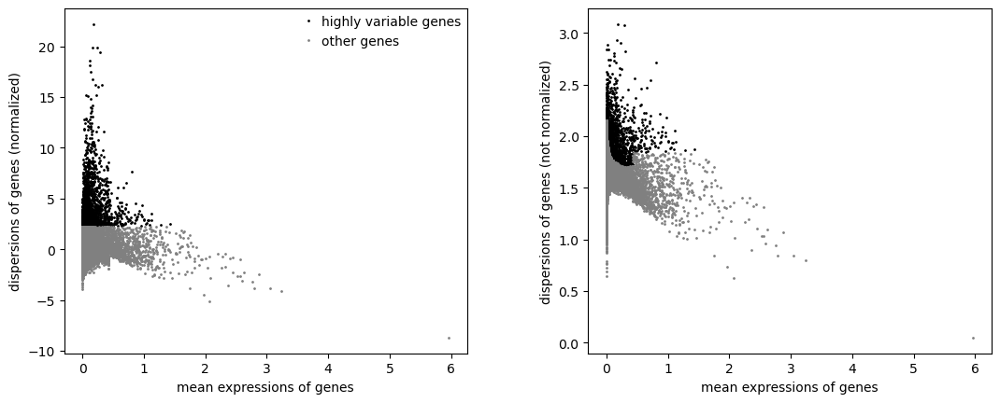


>>>Subsetting to top 2000 HVGs...

>>>Integrating with respect to sample (SCANVI)...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


	***Using counts layer for scanvi...
	***Using None, None as covariates...
	***Setting up scVI model: {'n_latent': 40, 'n_hidden': 400}...
	***Traning scVI: {'max_epochs': 100, 'accelerator': 'gpu', 'batch_size': 1024, 'early_stopping': True}...


Training:   0%|          | 0/100 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=100` reached.


	***Setting up scANVI model: {'n_latent': 40, 'n_hidden': 400}...
	***Traning scANVI: {'max_epochs': 100, 'accelerator': 'gpu', 'batch_size': 1024, 'early_stopping': True}...
INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 45 records. Best score: 514.309. Signaling Trainer to stop.


... storing 'annotation_scanvi' as categorical


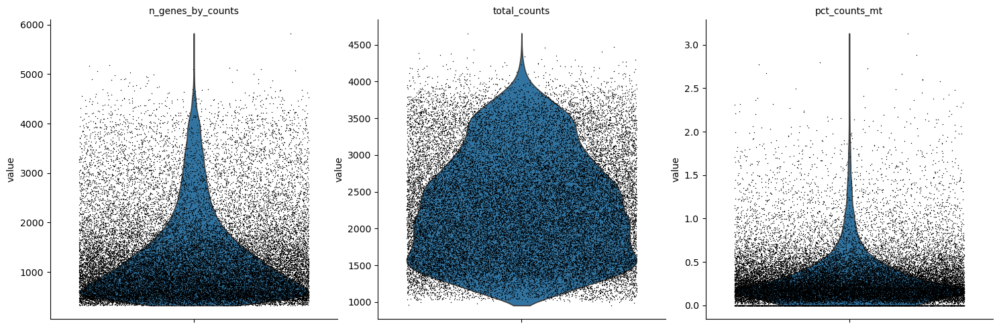

count    23253.000000
mean      1795.854599
std       2890.743089
min          3.000000
25%         73.000000
50%        568.000000
75%       2261.000000
max      31446.000000
Name: n_cells_by_counts, dtype: float64


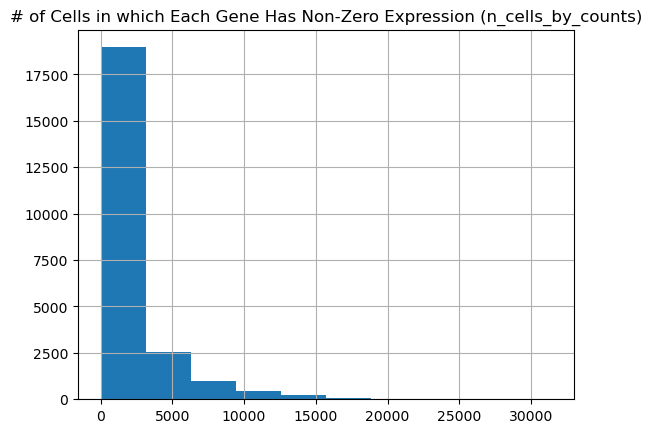

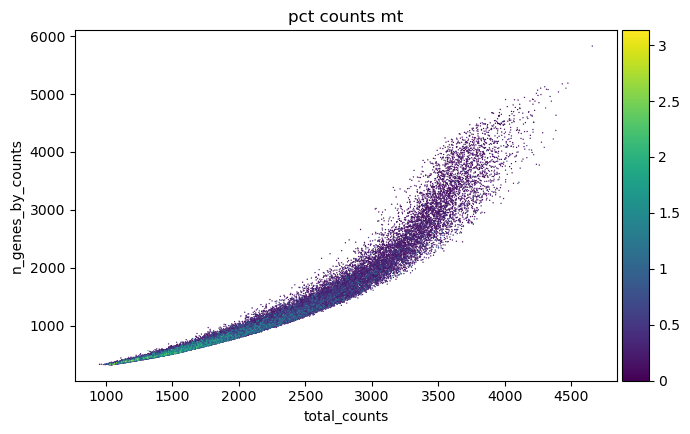

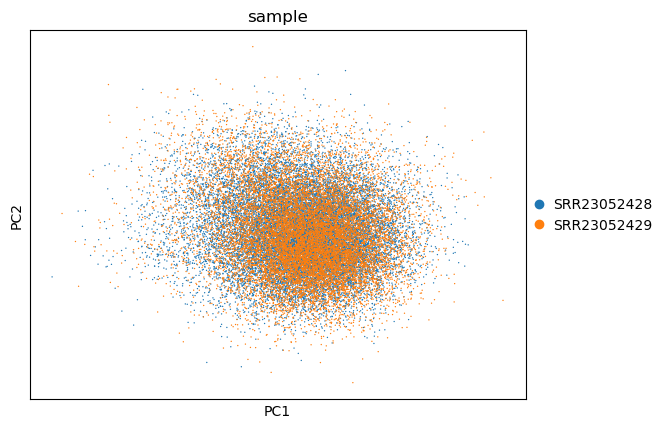

... storing 'kws_integrate' as categorical


AnnData object with n_obs × n_vars = 31446 × 23253
    obs: 'sample', 'n_cells_original_sample', 'Condition', 'kws_pp_sample', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'log1p_total_counts_hb', 'n_counts', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_individual_res0.15dist0.15', 'annotation_by_markers_individual_res0.15dist0.15', 'annotation_by_markers_individual_heterogeneous_collapsed', 'leiden_individual', 'annotation_by_markers_individual', 'kws_cluster_individual', 'annotation_scanvi', 'kws_integrate'
    var: 'gene_ids', 'feature_types', 'mt', 'ribo', 'hb', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'
    uns: 'log

,sample,n_cells_original_sample,Condition,kws_pp_sample,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt,total_counts_ribo,pct_counts_ribo,log1p_total_counts_ribo,total_counts_hb,pct_counts_hb,log1p_total_counts_hb,n_counts,n_genes,doublet_score,predicted_doublet,leiden_individual_res0.15dist0.15,annotation_by_markers_individual_res0.15dist0.15,annotation_by_markers_individual_heterogeneous_collapsed,leiden_individual,annotation_by_markers_individual,kws_cluster_individual,annotation_scanvi,kws_integrate
AAACCCAAGAGTTCGG-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells'...",765,1941.574829,6.641182,7.571770,9.624470,0.495704,2.363160,7.865369,0.405103,2.182153,0.000000,0.000000,0.000000,993.0,767,0.002254,False,3,Pericyte,Pericyte,3,Pericyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",Pericyte,{'col_celltype': 'annotation_by_markers_indivi...
AAACCCAAGATTGTGA-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells'...",2007,3194.267334,7.604894,8.069426,1.350562,0.042281,0.854654,14.969015,0.468621,2.770650,1.350562,0.042281,0.854654,3499.0,2009,0.041719,False,0,Oligodendrocyte,Oligodendrocyte,0,Oligodendrocyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",Oligodendrocyte,{'col_celltype': 'annotation_by_markers_indivi...
AAACCCAAGTGCCAGA-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells'...",2399,3327.978516,7.783224,8.110421,1.075810,0.032326,0.730351,18.731564,0.562851,2.982220,0.000000,0.000000,0.000000,5175.0,2399,0.028328,False,7,Inhibitory,Inhibitory,7,Inhibitory,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",Inhibitory,{'col_celltype': 'annotation_by_markers_indivi...
AAACCCAAGTTGAATG-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells'...",2280,3235.130127,7.732369,8.082133,5.981792,0.184901,1.943306,7.076156,0.218729,2.088916,0.000000,0.000000,0.000000,5032.0,2280,0.021174,False,1,Astrocyte,Astrocyte,1,Astrocyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",Astrocyte,{'col_celltype': 'annotation_by_markers_indivi...
AAACCCACAATTCTTC-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells'...",924,2098.277344,6.829794,7.649348,6.093319,0.290396,1.959153,10.780834,0.513794,2.466474,0.000000,0.000000,0.000000,1510.0,924,0.050669,False,9,OPC,OPC,9,OPC,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",OPC,{'col_celltype': 'annotation_by_markers_indivi...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGTCGAATGCT-1_SRR23052429,SRR23052429,15125,Control,"{'min_max_genes': [325, None], 'min_max_cells'...",1922,2881.593262,7.561642,7.966445,12.326752,0.427776,2.589773,20.215572,0.701541,3.054735,0.000000,0.000000,0.000000,4257.0,1922,0.023757,False,3,Oligodendrocyte,Oligodendrocyte,3,Oligodendrocyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",Oligodendrocyte,{'col_celltype': 'annotation_by_markers_indivi...
TTTGTTGTCGCTAAAC-1_SRR23052429,SRR23052429,15125,Control,"{'min_max_genes': [325, None], 'min_max_cells'...",1614,2719.958252,7.387090,7.908740,1.961062,0.072099,1.085548,17.917770,0.658752,2.940102,1.961062,0.072099,1.085548,3275.0,1614,0.043113,False,3,Oligodendrocyte,Oligodendrocyte,3,Oligodendrocyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",Oligodendrocyte,{'col_celltype': 'annotation_by_markers_indivi...
TTTGTTGTCTAAGCGT-1_SRR23052429,SRR23052429,15125,Control,"{'min_max_genes': [325, None], 'min_max_cells'...",1405,2566.608154,7.248504,7.850730,0.000000,0.000000,0.000000,14.542569,0.566607,2.743583,0.000000,0.000000,0.000000,2690.0,1405,0.031539,False,3,Oligodendrocyte,Oligodendrocyte,3,Oligodendrocyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comp...",Oligodendrocyte,{'col_celltype': 'annotation_by_markers_indivi...
TTTGTTGTCTGCCTGT-1_S

In [17]:
%%time

# Integration Options
cct_available = kws_cluster is not None and (
    markers_predefined is not None)  # individual annotations available?
kws_vi = {"early_stopping": True,
          "batch_size": 1024,  # raise/lower if more/less than 16 GB VRAM
          "max_epochs": 100,
          "accelerator": "gpu",
          "categorical_covariate_keys": covariates_categorical,
          "continuous_covariate_keys": covariates_continuous,
          "n_latent": 40, "n_hidden": 400}  # scVI/scANVI arguments
if covariates_categorical is not None:
    print(metadata[0][covariates_categorical + [
        col_condition]].value_counts().unstack(col_condition).replace(
            np.nan, 0).astype(int))
kws_integrate = {
    "col_celltype": cci_scanvi if cct_available else None,
    "flavor": "scanvi",
    # "flavor": "scvi",
    # "flavor": "scanorama",
    # "flavor": "harmony",
    "kws_pp": None, "kws_cluster": None,
    "vars_regress_out": vars_regress_out,
    "max_value": 10, "zero_center": True, "target_sum": 1e4,
    "n_top_genes": n_top_genes,
    "join": join_method, "merge": "same",
    "col_batch": None,  # suppress using batch as covariate
    "drop_non_hvgs": True,  # just for the integration part
    "use_rapids": True,
    "fill_value": np.nan if join_method == "outer" else None,
    "out_file": file_concat, **kws_vi
}

# If scVI/scANVI Integration & Individual Annotations Available
if kws_integrate["flavor"] in ["scvi", "scanvi"] and cct_available is True:
    kws_integrate.update({"unlabeled_category": unlabeled_cat})

# Integrate & Store Integration Parameters in Object
self = scflow.Rna(adatas, col_sample=col_sample,
                  col_batch=col_batch, kws_integrate=kws_integrate)
self.rna.obs = self.rna.obs.assign(kws_integrate=str(kws_integrate))
del adatas

# Write Files for Processed/Integrated Objects?
if overwrite is True or not os.path.exists(file_new):
    self.rna.write_h5ad(file_new)

# Display
print(self.rna)
self.rna.obs

## Benchmark Integration

In [ ]:
# if kws_integrate["flavor"] == "scanvi":
#     try:
#         results_integration_benchmark = scflow.pp.benchmark_integration(
#             self.rna, col_sample, col_celltype="annotation_scanvi")
#     except Exception as err:
#         print(err)

# Clustering

Perform PCA, UMAP embedding, and Leiden clustering on the integrated object

Marker gene-related code looks at top markers by log2fold-change and adjusted p-value cutoffs and sorts by adjusted p-values. Plots for predefined marker expression by cluster (if available) and cluster DEGs are created. Use `kind = ["heat", "dot"]` to get dot plots too.

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/IPython/extensions/deduperreload/deduperreload.py:290: DeprecationWarning: ast.Ellipsis is deprecated and will be removed in Python 3.14; use ast.Constant instead
  elif not isinstance(ast_elt, (ast.Ellipsis, ast.Pass)):


	***Building neighborhood with 40 neighbors...
	***Embedding UMAP with minimum distance 1...
	***Performing Leiden clustering with resolution 0.05...
        n_cells
leiden         
0         17170
1          4425
5          3214
2          2708
3          2286
4          1473
6           170
leiden          0     1     2     3    4     5    6
sample                                             
SRR23052428  9172  2107  1710  1302  889  2234  111
SRR23052429  7998  2318   998   984  584   980   59


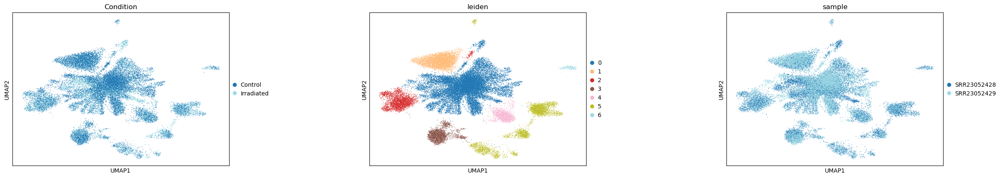

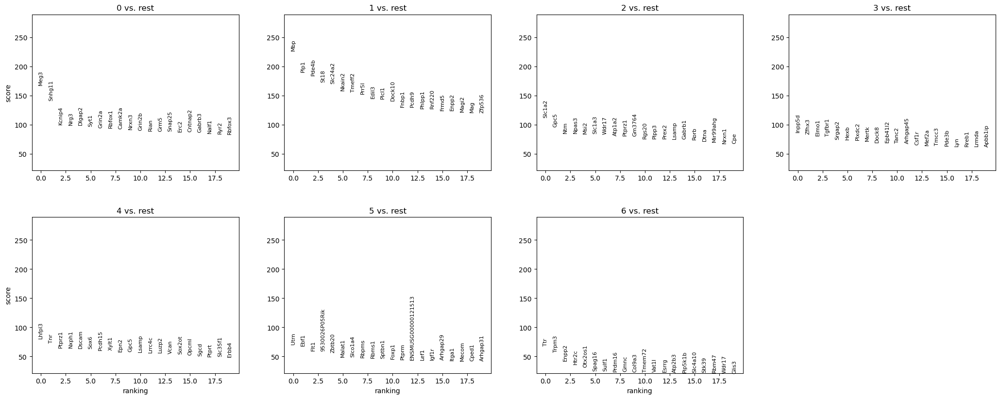

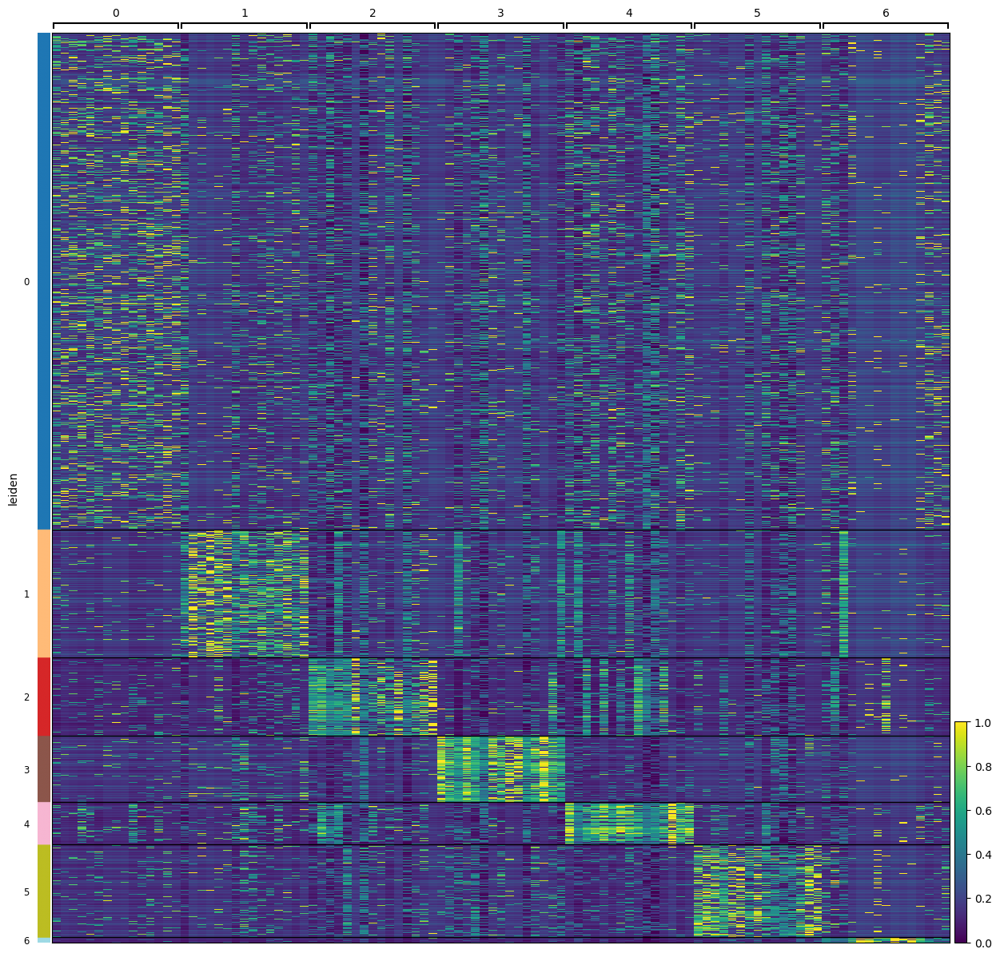

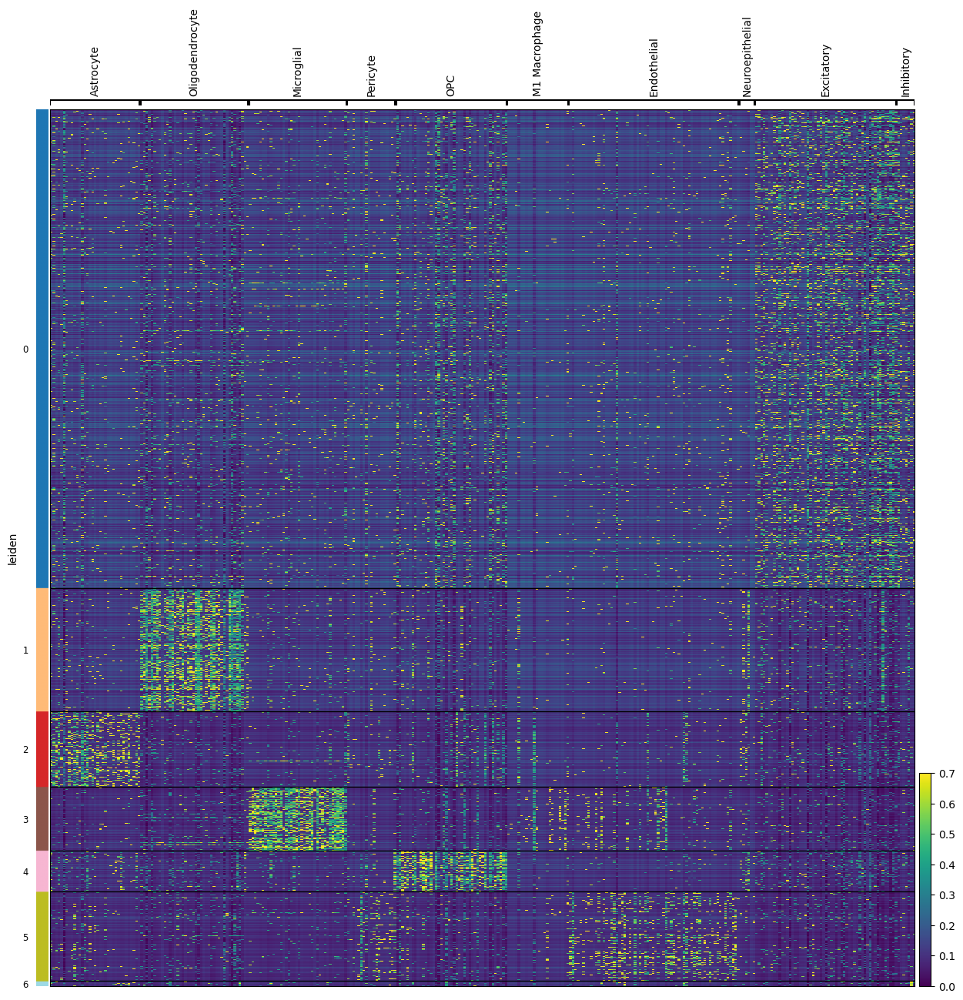

CPU times: user 10.5 s, sys: 961 ms, total: 11.5 s
Wall time: 4.42 s


scores  logfoldchanges          pvals      pvals_adj
leiden names                                                                       
5      9530026P05Rik        59.191982        4.715559   0.000000e+00   0.000000e+00
       Flt1                 59.903149        6.320314   0.000000e+00   0.000000e+00
       Ebf1                 68.742752        6.199884   0.000000e+00   0.000000e+00
       Utrn                 70.949646        4.075416   0.000000e+00   0.000000e+00
       Itga1                43.446995        5.408132   0.000000e+00   0.000000e+00
       Arhgap29             43.926888        4.775108   0.000000e+00   0.000000e+00
       Igf1r                44.033245        2.593104   0.000000e+00   0.000000e+00
       Lef1                 44.213268        5.453298   0.000000e+00   0.000000e+00
       ENSMUSG00000121513   44.334709        2.689937   0.000000e+00   0.000000e+00
       Ptprm                45.105923        2.826114   0.000000e+00   0.000000e+00
       Foxp1                45.945210        2.119253   0.000000e+00   0.000000e+00
       Sptbn1               47.015118        2.198020   0.000000e+00   0.000000e+00
       Rbms1                47.473682        3.133808   0.000000e+00   0.000000e+00
       Rbpms                48.741638        5.900526   0.000000e+00   0.000000e+00
       Slco1a4              49.218567        5.722238   0.000000e+00   0.000000e+00
0      Stxbp1               43.840782        1.669140   0.000000e+00   0.000000e+00
       Dlx6os1              42.921047        2.613682   0.000000e+00   0.000000e+00
       Slc12a5              42.992908        2.089599   0.000000e+00   0.000000e+00
       Sez6l                43.006886        1.849213   0.000000e+00   0.000000e+00
       Rab3c                43.020138        2.010762   0.000000e+00   0.000000e+00
       Galnt18              43.025433        1.759096   0.000000e+00   0.000000e+00
       Nwd2                 43.218571        2.676331   0.000000e+00   0.000000e+00
       Hook1                43.379322        2.421521   0.000000e+00   0.000000e+00
       Iqsec3               43.607662        2.770715   0.000000e+00   0.000000e+00
       Shisa9               43.616940        1.760089   0.000000e+00   0.000000e+00
       Cap2                 43.699543        1.714570   0.000000e+00   0.000000e+00
       Epha7                42.869846        1.908375   0.000000e+00   0.000000e+00
       Nrg2                 43.862743        1.913235   0.000000e+00   0.000000e+00
       Ankrd33b             43.886627        2.593358   0.000000e+00   0.000000e+00
       Elavl2               43.915802        2.369043   0.000000e+00   0.000000e+00
2      Slc1a2              111.650490        4.798876   0.000000e+00   0.000000e+00
       Gpc5                 96.026787        5.926573   0.000000e+00   0.000000e+00
       Ntm                  85.706963        3.819605   0.000000e+00   0.000000e+00
       Npas3                85.207275        4.042206   0.000000e+00   0.000000e+00
       Msi2                 84.889549        3.695221   0.000000e+00   0.000000e+00
       Phkg1                48.870403        5.513732   0.000000e+00   0.000000e+00
       Son                  48.042419        1.900037   0.000000e+00   0.000000e+00
       Prkd1                47.483154        3.159637   0.000000e+00   0.000000e+00
       Ndrg2                47.478657        3.807368   0.000000e+00   0.000000e+00
       Fmn2                 47.430084        2.598423   0.000000e+00   0.000000e+00
       Rfx4                 46.900543        5.387318   0.000000e+00   0.000000e+00
       B3galt1              46.422337        2.148641   0.000000e+00   0.000000e+00
       Acsl3                46.168800        3.180386   0.000000e+00   0.000000e+00
       Phka1                45.521301        3.695049   0.000000e+00   0.000000e+00
       Gm973                45.462227        6.390105   0.000000e+00   0.000000e+00
4      Lhfpl3               81.291519        6.006577   0.000000e+00   0.000000e+00

In [47]:
%%time

# Clustering Options
resolution, min_dist = 0.05, 1
n_neighbors = 40
cct = "leiden"  # key added/column name

# Set Default Cell Type Column
col_celltype = cct
self._info["col_celltype"] = col_celltype

# Clustering
self.cluster(col_celltype=cct, resolution=resolution, min_dist=min_dist,
             kws_pca=False, layer="scaled",
             kws_neighbors=dict(n_neighbors=n_neighbors))  # cluster
self.rna.obs = self.rna.obs.assign(**{
       f"{cct}_resolution": resolution}).assign(
              **{f"{cct}_n_neighbors": n_neighbors}).assign(
                     **{f"{cct}_min_dist": min_dist})  # store parameters
_ = self.plot(kind="umap", wspace=0.5, palette="tab20",
              color=[col_batch, "leiden", col_sample])  # plot UMAP
print(self.rna.obs["leiden"].value_counts().to_frame("n_cells"))  # N/cluster
print(self.rna.obs.groupby(col_sample).apply(lambda x: x[
       cct].value_counts(), include_groups=False).unstack(1))  # by group

# DEGs (One Cluster versus All)
self.find_markers(col_celltype=cct)  # DEGs by cluster
markers_df = self.get_markers_df(
    n_genes=15, col_celltype=cct,
    p_threshold=1e-10, log2fc_threshold=1.5, log2fc_threshold_abs=False)
markers_dict = dict(markers_df.groupby(cct).apply(
    lambda x: list(x.reset_index().names)))  # dictionary version of df
_ = self.plot(genes=markers_dict, figsize=(15, 15),
              layer="scaled", standard_scale="obs", kind="heat")
if markers_predefined is not None:
    mks_c = dict(zip(markers_predefined, [markers_predefined[x].intersection(
           self.rna.var_names) for x in markers_predefined]))
    mks_c["Inhibitory"] = mks_c["Inhibitory"].difference(mks_c["Excitatory"])
    mks_c["Excitatory"] = mks_c["Excitatory"].difference(mks_c["Inhibitory"])
    _ = self.plot(genes=mks_c, figsize=(15, 15), vmax=0.7,
                  layer="scaled", standard_scale="obs", kind="heat")
markers_df

# Sub-Clustering

Sub-cluster the biggest <subcluster_biggest> Leiden clusters?

For instance if `subcluster_biggest = 3`, take top three most abundant (highest cell count) clusters and sub-cluster them.

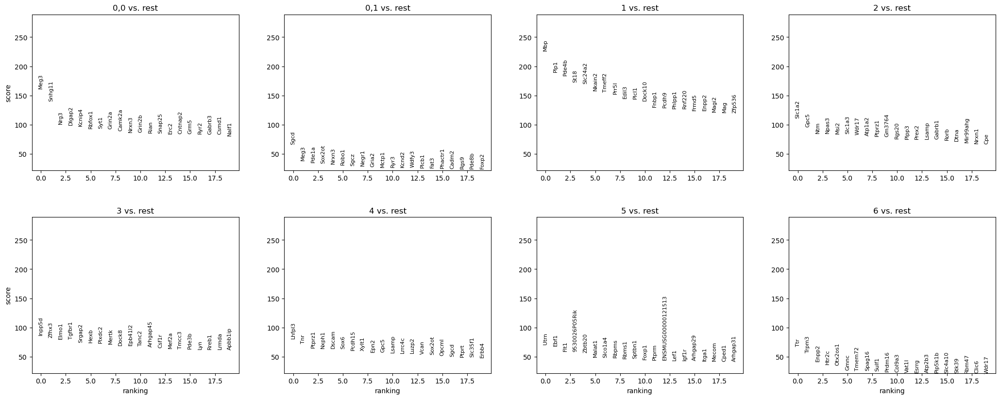

leiden_subcluster   0,0  0,1     1     2     3    4     5    6
sample                                                        
SRR23052428        8966  206  2107  1710  1302  889  2234  111
SRR23052429        7982   16  2318   998   984  584   980   59


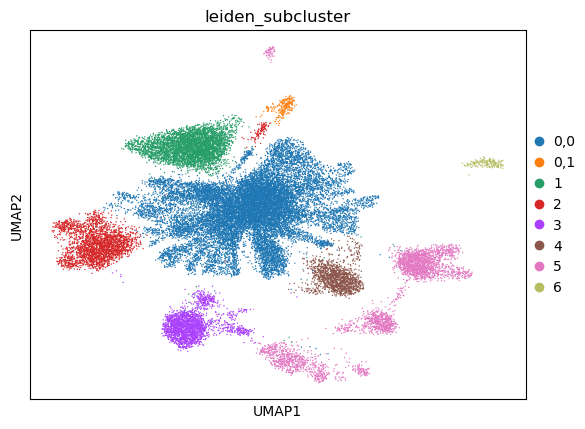

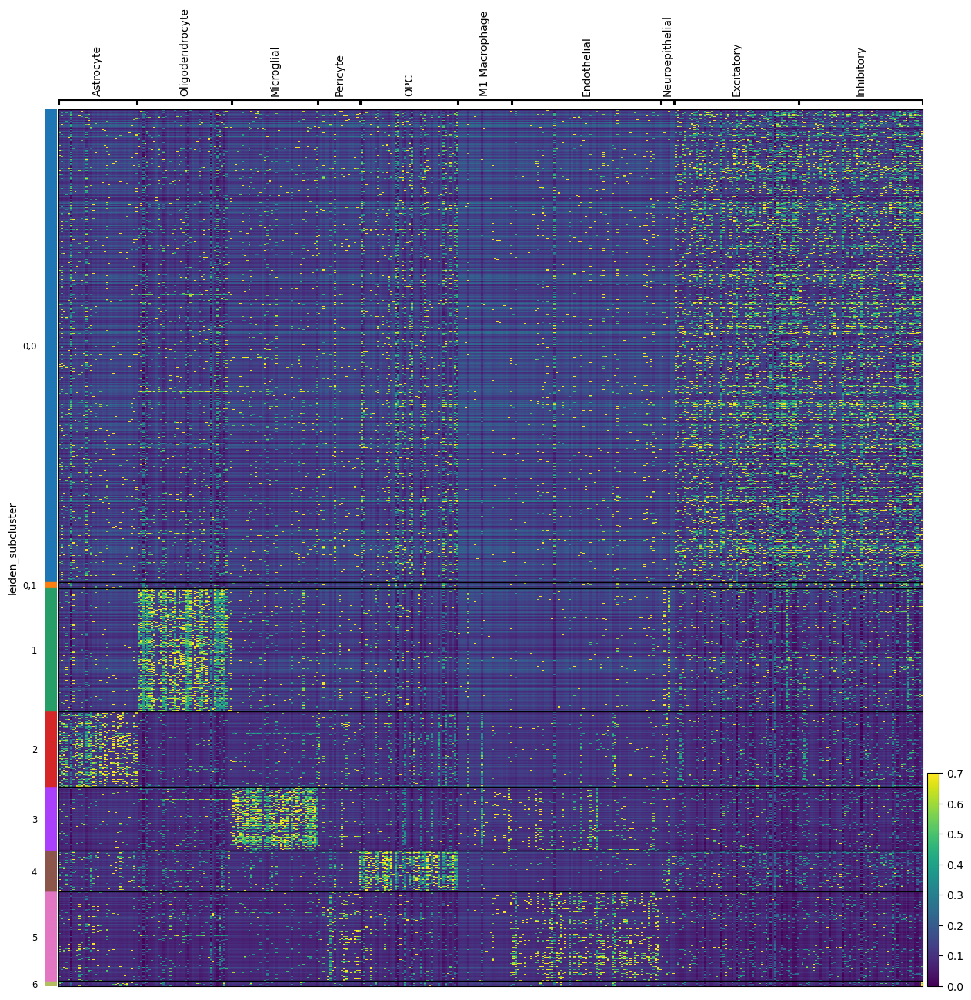

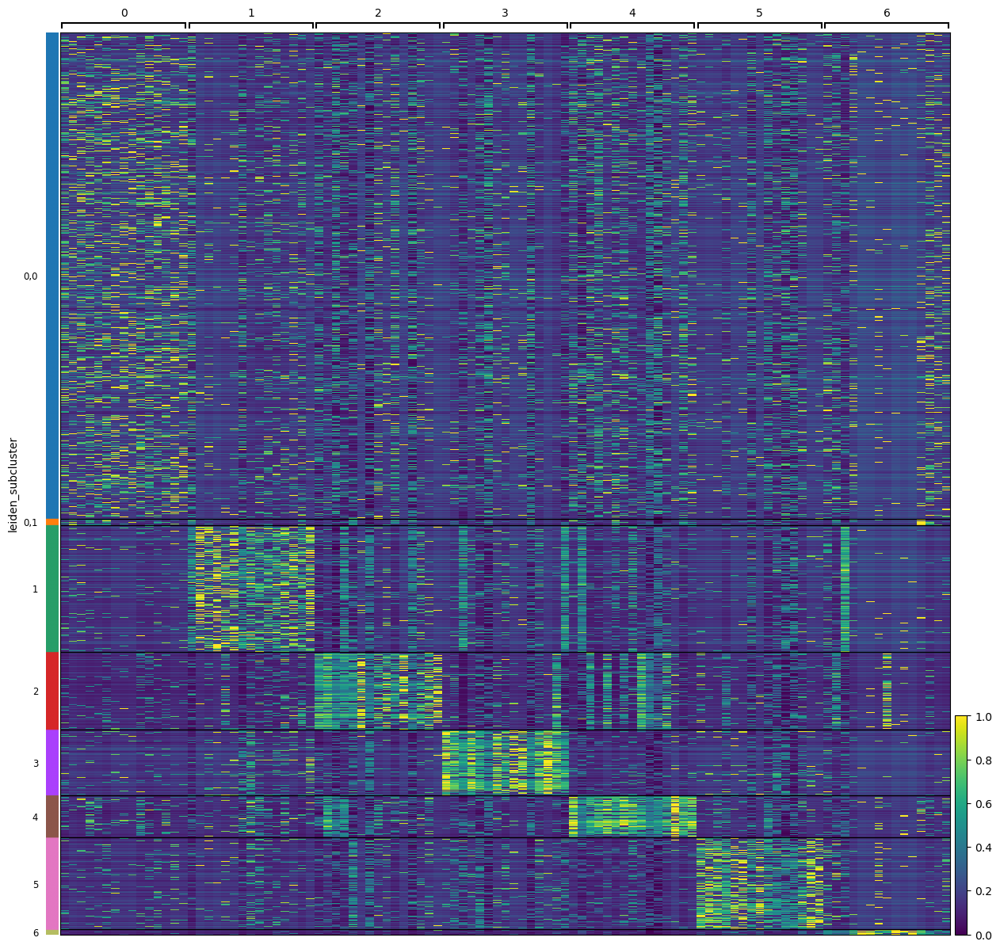

                               scores  logfoldchanges          pvals      pvals_adj
leiden names                                                                       
5      9530026P05Rik        59.191982        4.715559   0.000000e+00   0.000000e+00
       Flt1                 59.903149        6.320314   0.000000e+00   0.000000e+00
       Ebf1                 68.742752        6.199884   0.000000e+00   0.000000e+00
       Utrn                 70.949646        4.075416   0.000000e+00   0.000000e+00
       Itga1                43.446995        5.408132   0.000000e+00   0.000000e+00
       Arhgap29             43.926888        4.775108   0.000000e+00   0.000000e+00
       Igf1r                44.033245        2.593104   0.000000e+00   0.000000e+00
       Lef1                 44.213268        5.453298   0.000000e+00   0.000000e+00
       ENSMUSG00000121513   44.334709        2.689937   0.000000e+00   0.000000e+00
       Ptprm                45.105923        2.826114   0.000000e+00   0.000

In [56]:
resolution_sub = None if subcluster_biggest is False else 0.07

if subcluster_biggest is not False:

    # Sub-Clustering
    col_celltype = "leiden_subcluster"
    biggest_clusters = self.rna.obs["leiden"].value_counts().index.values[
        :min(len(self.rna.obs["leiden"].unique()), subcluster_biggest)]
    self.rna.obs.loc[:, col_celltype] = self.rna.obs.leiden.copy()
    for x in biggest_clusters:
        sc.tl.leiden(self.rna, restrict_to=(col_celltype, [x]),
                     key_added=col_celltype, resolution=resolution_sub,
                     seed=0, n_iterations=-1, use_weights=True)
    self.find_markers(col_celltype=col_celltype)  # DEGs by cluster
    self.plot(kind="umap", color=col_celltype)
    print(self.rna.obs[[col_sample, col_celltype]].groupby(
        col_sample).value_counts().unstack(1))
    self.rna.obs.loc[:, f"resolution_{col_celltype}"] = resolution_sub
    self._info["col_celltype"] = col_celltype

    # Marker Plots
    if markers_predefined is not None:
        mks_c = dict(zip(markers_predefined, [markers_predefined[
            x].intersection(self.rna.var_names) for x in markers_predefined]))
        _ = self.plot(genes=mks_c, figsize=(15, 15), vmax=0.7,
                      layer="scaled", standard_scale="obs", kind="heat")
    markers_df = self.get_markers_df(
        n_genes=15, col_celltype=cct,
        p_threshold=1e-10, log2fc_threshold=1.5, log2fc_threshold_abs=False)
    markers_dict = dict(markers_df.groupby(cct).apply(
        lambda x: list(x.reset_index().names)))  # dictionary version of df
    _ = self.plot(genes=markers_dict, figsize=(15, 15),
                  layer="scaled", standard_scale="obs", kind="heat")
    print(markers_df)

# Annotate

Annotate cell types with various methods

## Annotate by Marker Gene Overlap

File from https://github.com/nasa/GeneLab_Data_Processing/blob/master/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files/GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv

**Example of the Expected Marker Definition Format**
```
markers_predefined = {
    "CD4 T cells": {"IL7R"},
    "CD14+ Monocytes": {"CD14", "LYZ"},
    "B cells": {"MS4A1"},
    "CD8 T cells": {"CD8A"},
    "NK cells": {"GNLY", "NKG7"},
    "FCGR3A+ Monocytes": {"FCGR3A", "MS4A7"},
    "Dendritic Cells": {"FCER1A", "CST3"},
    "Megakaryocytes": {"PPBP"},
}
```

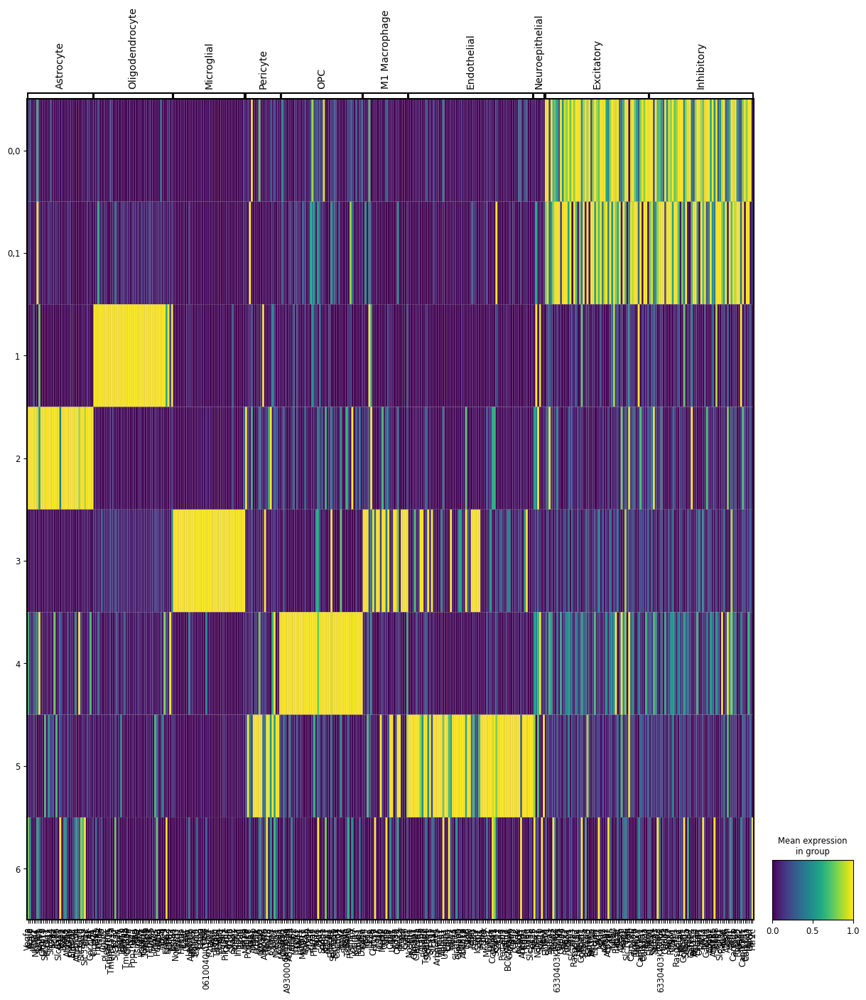

annotation_by_overlap
Neuron             53.90
Oligodendrocyte    14.61
Endothelial        10.22
Astrocyte           8.61
Microglial          7.27
OPC                 5.39
Name: proportion, dtype: float64


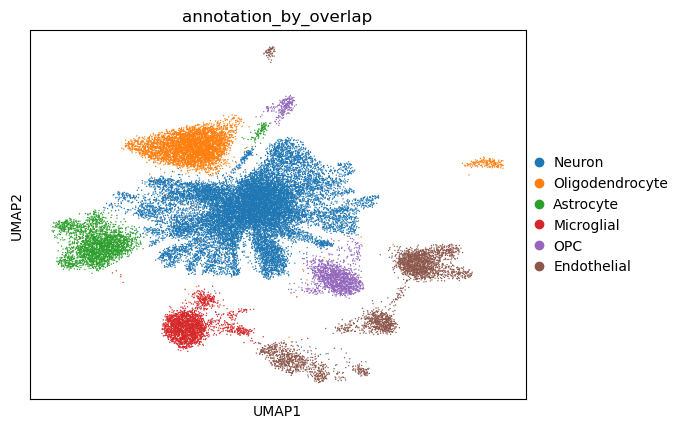

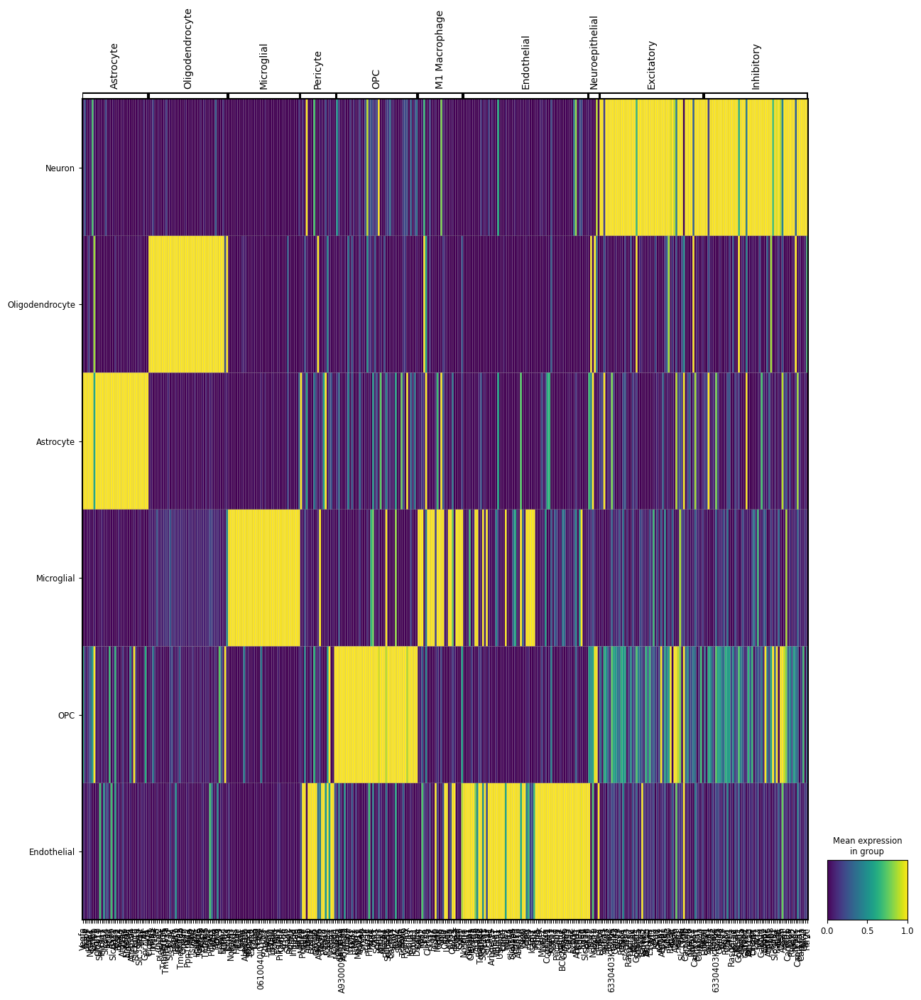

leiden_subcluster  annotation_by_overlap
6                  Oligodendrocyte           0.54
0,1                OPC                       0.71
4                  OPC                       4.68
3                  Microglial                7.27
2                  Astrocyte                 8.61
5                  Endothelial              10.22
1                  Oligodendrocyte          14.07
0,0                Neuron                   53.90
Name: proportion, dtype: float64

In [ ]:
# Plot
_ = self.plot(genes=mks_c, figsize=(15, 15),
              layer="scaled", standard_scale="var", kind="matrix")

# Annotate
marker_matches = self.annotate(
    mks_collapsed,
    # celltypes_superhierarchical=celltypes_superhierarchical,
    col_celltype=col_celltype, col_celltype_new="annotation_by_overlap",
    top_n_markers=50,  # can only have this one or `adj_pval_threshold`
    # adj_pval_threshold=1e-10,
    # method="overlap_count",
    method="overlap_coef",
    # method="jaccard",
    overwrite=True)

# Rename Any Labels As Pre-Specified
if rename_marker_based_annotation is not None:
    self.rna.obs.loc[:, "annotation_by_overlap"] = self.rna.obs[
        "annotation_by_overlap"].replace(rename_marker_based_annotation)

# Print & Plot Results
self.plot(kind="umap", color="annotation_by_overlap", wspace=0.4)
print(round(self.rna.obs["annotation_by_overlap"].value_counts(
    normalize=True) * 100, 2))
_ = self.plot(genes=mks_c, figsize=(15, 15),
              col_celltype="annotation_by_overlap",
              layer="scaled", standard_scale="var", kind="matrix")
round(self.rna.obs[[col_celltype, "annotation_by_overlap"]
                   ].value_counts(normalize=True)* 100, 2).sort_values(
                       ascending=False)

## Annotate with ToppGene

In [58]:
# Options
min_genes = 2  # minimum markers that have to overlap between Leiden & atlas
remove_strings = ["----L1-6", # "---[|]M.*",
                  "facs-", "-nan-",
                  # "-i_Gaba_3-.*",
                  "Brain_organoid-organoid_Kanton_Nature-Organoid-..-",
                  # "Non-neuronal-Macroglial-((^|)(Oligo|Astro))+-",
                  # "-Glut_E.*IL7R",
                  "cells hierarchy compared to all cells using T-S.*",
                  ".*-organoid_Tanaka_cellReport-.+-",
                  "...BrainAtlas -.*", "-eN2.*", "...Sample groups.*",
                  "...Sample Type, Dataset.*",
                  "-Neuronal",
                  " // Primary Cells by Cluster",
                  ".World...Primary Cells by Cluster",
                  "Brain_organoid-organoid_Velasco_nature-6_",
                  "Fetal_brain-fetalBrain_Zhong_nature-....-",
                  "Somatosensory_Cortex_....-Neuronal-",
                  "Non-neuronal-Non-dividing-",
                  "...Sample groups..6 Anatomical region groups., with 5.*",
                  "Brain_organoid-organoid_Paulsen_bioRxiv-",
                  "-Glut_E_(THEMIS)", "[(]THEMIS[)]",  # "[|].*",
                  "- method, tissue, subtissue, age, lineage.*"]
drop_name_patterns = ["striatum", "globus", "Entopeduncular",
                      "Substantia_nigra-", "Thalamus-"]
toppgene_rename_by_pattern = dict(
    Inhibitory=["Inh(_|ib)", "GABA"], Excitatory=["Excit", "Glut"],
    # Inhibitory=["Inh(_|ib)"], Excitatory=["Excit"],
    # # Gabaergic=["GABA"], Glutamatergic=["Glut"],
    Astrocyte=["Astrocyte","Astroglia", "Macroglial-Astro"],
    Microglial=["Microglia", "Micro"],
    Endothelial=["Endothelial"],
    Oligodendrocyte=[r"^(?=.*oligo)(?!.*poly)(?!.*opc).*"],
    OPC=["Polydendrocyte", "OPC"])
drop_regions = [
    "Mid-temporal_gyrus_(MTG)", "primary_auditory_cortex_(A1C)",
    "Somatosensory_Cortex_(S1)", "Anterior_Cingulate_gyrus_(CgG)",
    "Primary_Motor_Cortex_(M1)",
    "Mid-temporal_gyrus_(MTG)|Mid-temporal_gyrus_(MTG)",
    "primary_auditory_cortex_(A1C)|primary_auditory_cortex_(A1C)",
    "Somatosensory_Cortex_(S1)|Somatosensory_Cortex_(S1)",
    "Anterior_Cingulate_gyrus_(CgG)|Anterior_Cingulate_gyrus_(CgG)",
    "Primary_Motor_Cortex_(M1)|Primary_Motor_Cortex_(M1)",
    r"Neuronal|World / ",
    "Primary_Visual_cortex_(V1C)|Primary_Visual_cortex_(V1C)",
    "mon",
    "BMP_responsible_cell|6m", "bearing_cell|6m", "bearing_cell|GW16", "11",
    "Non-neuronal-Non-dividing",
    "Frontal_cortex|Frontal_cortex",
    "Primary_Visual_cortex_(V1C)", "Substantia_nigra",
    "Thalamus", "Hippocampus", "Frontal_cortex"
]  # remove if name is just a region or top-level hierarchical/undesired type
drop_regions = drop_regions + [f"{i}-Non-neuronal" for i in drop_regions]

# Query ToppGene
results_toppgene = scflow.pp.annotate_by_toppgene(
    markers_dict, remove_strings=remove_strings,
    species=species, min_genes=min_genes, source_patterns=source_patterns)

# Remove or Alter Certain Name Patterns
drop_names = results_toppgene.Name.apply(lambda x: not any((
    i.lower() in x.lower() for i in drop_name_patterns)))
results_toppgene = results_toppgene[drop_names]
rn_tg = results_toppgene.Name.apply(lambda x: {x: " | ".join([
    j for j in toppgene_rename_by_pattern if any((re.search(i.lower(
        ), x.lower()) is not None for i in toppgene_rename_by_pattern[
            j]))])}).apply(lambda x: np.nan if x[list(x.keys())[
                0]] == "" else x).dropna().reset_index(drop=True).apply(
                    lambda x: pd.Series(x)).stack().reset_index(
                        0, drop=True)  # renaming guide
results_toppgene = results_toppgene.replace({"Name": dict(rn_tg)})
results_toppgene = results_toppgene[~results_toppgene.Name.isin(drop_regions)]

# Map Labels (Plurality Vote If Sufficient or Top)
top_cs = dict(results_toppgene.groupby(
    "Gene Set").apply(lambda x: x.Name.iloc[:10].value_counts().index.values[
        0] if x.Name.iloc[:10].value_counts(
            normalize=True).iloc[0] >= 0.25 else x.Name[0]))
print("\n".join([f"{k}: {top_cs[k]}" for k in top_cs]), "\n\n")
if "annotation_toppgene" in self.rna.obs:
    self.rna.obs = self.rna.obs.drop("annotation_toppgene", axis=1)
self.rna.obs = self.rna.obs.join(self.rna.obs[col_celltype].replace(
    top_cs).to_frame("annotation_toppgene")).loc[self.rna.obs.index]

# Display Results
if "annotation_by_overlap" in self.rna.obs:
    print(round(self.rna.obs[["annotation_toppgene", "annotation_by_overlap"]
                             ].value_counts(normalize=True).sort_index(
                                 ) * 100, 2), "\n\n")
print(round(self.rna.obs["annotation_toppgene"].value_counts(
    normalize=True) * 100, 2))
results_toppgene.reset_index("ID", drop=True).drop([
    "QValueBonferroni", "QValueFDRBY", "QValueFDRBH",
    "TotalGenes", "Genes"], axis=1)

Server returned HTTP status code: 400
Content: {'error': 'No valid lookup found for symbol ENSMUSG00000121513'}
0: Substantia_nigra|Substantia_nigra
1: Oligodendrocyte
2: Astrocyte
3: Microglial
4: OPC
5: Endothelial
6: BMP_responsible_cell|10w 


annotation_toppgene       annotation_by_overlap
0,0                       Neuron                   53.90
0,1                       OPC                       0.71
Oligodendrocyte           Oligodendrocyte          14.07
Astrocyte                 Astrocyte                 8.61
Microglial                Microglial                7.27
OPC                       OPC                       4.68
Endothelial               Endothelial              10.22
BMP_responsible_cell|10w  Oligodendrocyte           0.54
Name: proportion, dtype: float64 


annotation_toppgene
0,0                         53.90
Oligodendrocyte             14.07
Endothelial                 10.22
Astrocyte                    8.61
Microglial                   7.27
OPC                   

Name    PValue GenesInTerm GenesInQuery GenesInTermInQuery                                             Source  \
Gene Set Category                                                                                                                                                     
0        ToppCell        Substantia_nigra|Substantia_nigra       0.0         186           14                  4  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                              Neuronal|6m       0.0         200           14                  4  Integration of Four Brain Organoid Datasets an...   
         ToppCell           Mid-temporal_gyrus_(MTG)|World  0.000021         178           14                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                               Excitatory  0.000024         184           14                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                               Excitatory  0.000024         184           14                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                               Inhibitory  0.000027         193           14                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                     Cortical_neuron|GW10   0.00003         200           14                  3  Integration of Four Brain Organoid Datasets an...   
         ToppCell                              Neuronal|2m   0.00003         200           14                  3  Integration of Four Brain Organoid Datasets an...   
         ToppCell                       Cortical_neuron|6m   0.00003         200           14                  3  Integration of Four Brain Organoid Datasets an...   
         ToppCell                                Neuron|6m   0.00003         200           14                  3  Integration of Four Brain Organoid Datasets an...   
         ToppCell  Neuronal-cortical_neurons_2|Organoid-4M   0.00003         200           14                  3  Integration of Four Brain Organoid Datasets an...   
1        ToppCell                          Oligodendrocyte  0.000018         183           13                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                          Oligodendrocyte  0.000019         184           13                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                          Oligodendrocyte   0.00002         188           13                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                          Oligodendrocyte  0.000021         190           13                  3      Human Adult Multiple Cortical Areas SMART-seq   
2        ToppCell                                Astrocyte       0.0         200           15                  6                              Human Adult Brain MTG   
         ToppCell                                Astrocyte       0.0         200           15                  6                              Human Adult Brain MTG   
         ToppCell                                Astrocyte       0.0         200           15                  6                              Human Adult Brain MTG   
         ToppCell                                Astrocyte       0.0         200           15                  6                              Human Adult Brain MTG   
         ToppCell                                Astrocyte       0.0         200           15                  6                              Human Adult Brain MTG   
         ToppCell                                Astrocyte       0.0         200           15                  6                              Human Adult Brain MTG   
         ToppCell                                Astrocyte       0.0         187           15                  5      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                             

## Annotate with CellTypist

2025-09-04 14:02:44 | [INFO] 🔬 Input data has 31446 cells and 23253 genes
2025-09-04 14:02:44 | [INFO] 🔗 Matching reference genes in the model
2025-09-04 14:02:44 | [INFO] 🧬 5249 features used for prediction
2025-09-04 14:02:44 | [INFO] ⚖️ Scaling input data
2025-09-04 14:02:45 | [INFO] 🖋️ Predicting labels
2025-09-04 14:02:45 | [INFO] ✅ Prediction done!
2025-09-04 14:02:45 | [INFO] 👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
2025-09-04 14:02:45 | [INFO] ⛓️ Over-clustering input data with resolution set to 15
2025-09-04 14:02:46 | [INFO] 🗳️ Majority voting the predictions
2025-09-04 14:02:46 | [INFO] ✅ Majority voting done!


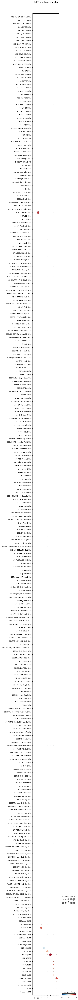

<timed exec>:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
<timed exec>:29: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


CPU times: user 12.1 s, sys: 1.23 s, total: 13.3 s
Wall time: 6.02 s


In [59]:
%%time

# To Aggregate More Specific Cell Types
celltypist_rename = dict(
    # Gabaergic=["GABA"], Glutamatergic=["Glut"],
    Dopaminergic=["Dopa"], Serotonergic=["Sero"],
    Inhibitory=["Inh", "GABA", "Gaba"],
    Excitatory=["Exc", "Glut", "PIR Ex IMN", "112 GPi Tbr1 Cngb3 Gaba-Glut"],
    Astrocyte=["Astro", "Bergmann", "CHOR NN"],
    Microglia=["Microglia"],
    Pericyte=["peri"],
    Monocyte=["Monocyte"],
    Ependymal=["Ependymal NN", "Tanycyte"],
    Macrophage=["BAM NN"],
    Lymphoid=["Lymphoid"],
    Endothelial=["Endothelial", "Endo"],
    Vascular=["329 ABC NN", "330 VLMC NN", "SMC NN"],
    Oligodendrocyte=[r"^(?=.*oligo)(?!.*poly)(?!.*opc).*"],
    OPC=["OPC", "Polydend"])

# Run CellTypist
self.rna.X = self.rna.layers["counts"].copy()
sc.pp.normalize_total(self.rna, target_sum=10000)
sc.pp.log1p(self.rna) # copy=True: do not update adata.X
predictions = self.annotate(
    model_celltypist, col_celltype=col_celltype, layer=None,
    col_celltype_new="", majority_voting=True, min_prop=0.5, use_GPU=True)

# Rename Cell Types
for x in ["predicted_labels", "majority_voting"]:
    rn_ct = predictions.predicted_labels.groupby(x).apply(
        lambda x: {x.name: " | ".join([
            j for j in celltypist_rename if any((re.search(
                i.lower(), x.name.lower()) for i in celltypist_rename[
                    j]))])}).apply(lambda x: {list(x.keys())[0]: list(x.keys(
                        ))[0]} if x[list(x.keys())[0] ] == "" else x).apply(
                            lambda x: pd.Series(x)).stack().reset_index(
                                0, drop=True)
    if f"annotation_{x}" in self.rna.obs:
        self.rna.obs = self.rna.obs.drop(f"annotation_{x}", axis=1)
    self.rna.obs = self.rna.obs.join(self.rna.obs.replace({
        x: dict(rn_ct)})[x].to_frame(f"annotation_{x}").replace({
            "Dopaminergic | Inhibitory": "Inhibitory",
            "Serotonergic | Excitatory": "Excitatory",
            "Astrocyte | Ependymal": "Astrocyte"}))
self.rna.X = self.rna.layers["scaled"].copy()

## Annotate with Map My Cells

- Make sure to run the following bash commonds after activating the conda environment used for this notebook.

- Pull [`cell_type_mapper`](https://github.com/AllenInstitute/cell_type_mapper) from GitHub (clone into your home directory): `cd && git clone git@github.com:AllenInstitute/cell_type_mapper.git`

- Navigate to that directory and run `pip install .`

- Navigate to the folder containing this notebook.

- Install ABC Atlas (while in same directory as this notebook): `pip install -U git+https://github.com/alleninstitute/abc_atlas_access >& scratch/junk.txt`

- Pull lookup files (while in same directory as this notebook):
```
cd resources
wget https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/mapmycells/WMB-10X/20240831/mouse_markers_230821.json
wget https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/mapmycells/WMB-10X/20240831/precomputed_stats_ABC_revision_230821.h5
```

---

Note: To use GPU + Torch, you may need to alter the file "cell_type_mapper/src/cell_type_mapper/cell_by_gene/cell_by_gene.py" line `np.where(np.logical_not(np.isfinite(data)))[0]` to read instead

```
try:
    nan_rows = np.where(
        np.logical_not(np.isfinite(data.cpu().numpy())))[0]
except Exception:
    nan_rows = np.where(np.logical_not(np.isfinite(data)))[0]
```

You may have to run the following code in this notebook:

```
os.environ["NUMEXPR_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"
```

and

    `_correlation_dot_gpu()` in distance_utils.py change
    `correlation = torch.matmul(arr0, arr1)` to

```
try:
    correlation = torch.matmul(arr0, arr1)
except RuntimeError as err:
    if "CUBLAS_STATUS_NOT_INITIALIZED" in str(err):
        arr0_cpu = arr0.cpu()
        arr1_cpu = arr1.cpu()
        correlation = torch.matmul(arr0_cpu, arr1_cpu).to(arr0.device)
    else:
        raise
```

to manage processes/memory.

In [ ]:
# %%time

# # Write File to Use as Input for Map My Cells
# if overwrite is True or not os.path.exists(file_new):
#     os.makedirs("data", exist_ok=True)
#     self.rna.X = self.rna.layers["counts"]
#     self.rna.write_h5ad(file_new)
# else:
#     raise ValueError("Must be able to overwrite to run Map My Cells.")

# # Run Map My Cells
# self.rna = scflow.pp.run_mapbraincells(
#     file_new, map_my_cells_source=map_my_cells_source,
#     dir_scratch="scratch", dir_resources="resources",
#     validate_output_file="scratch/tmp.h5ad",  # map_to_ensembl=True,
#     map_my_cells_region_keys=map_my_cells_region_keys,
#     map_my_cells_cell_keys=map_my_cells_cell_keys, verbose_stdout=True,
#     n_processors=4, chunk_size=5000, max_gb=5)

# View Results
# _ = self.plot(kind="umap", color=["cellmap_class_name"])
# if "annotation_toppgene" in self.rna.obs:
#     print(self.rna.obs[["cellmap_class_name", "annotation_toppgene"]
#                        ].value_counts().sort_index())
# self.rna.obs[[i for i in self.rna.obs if "cellmap" in i and "ori" not in i]]

## Compare Annotations

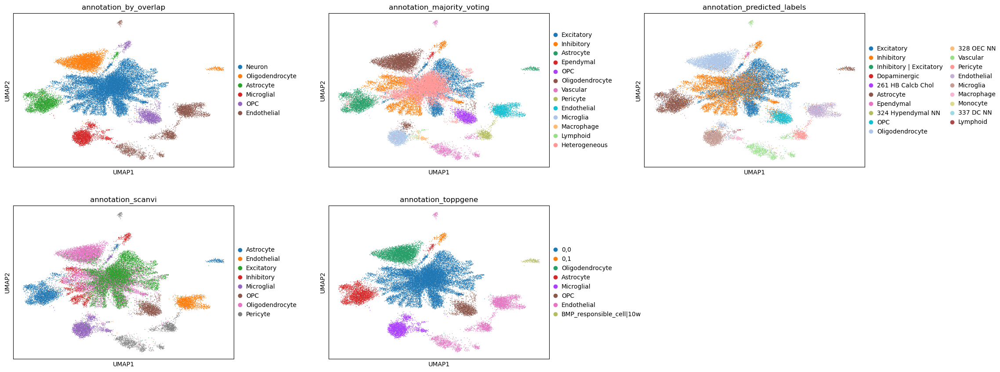

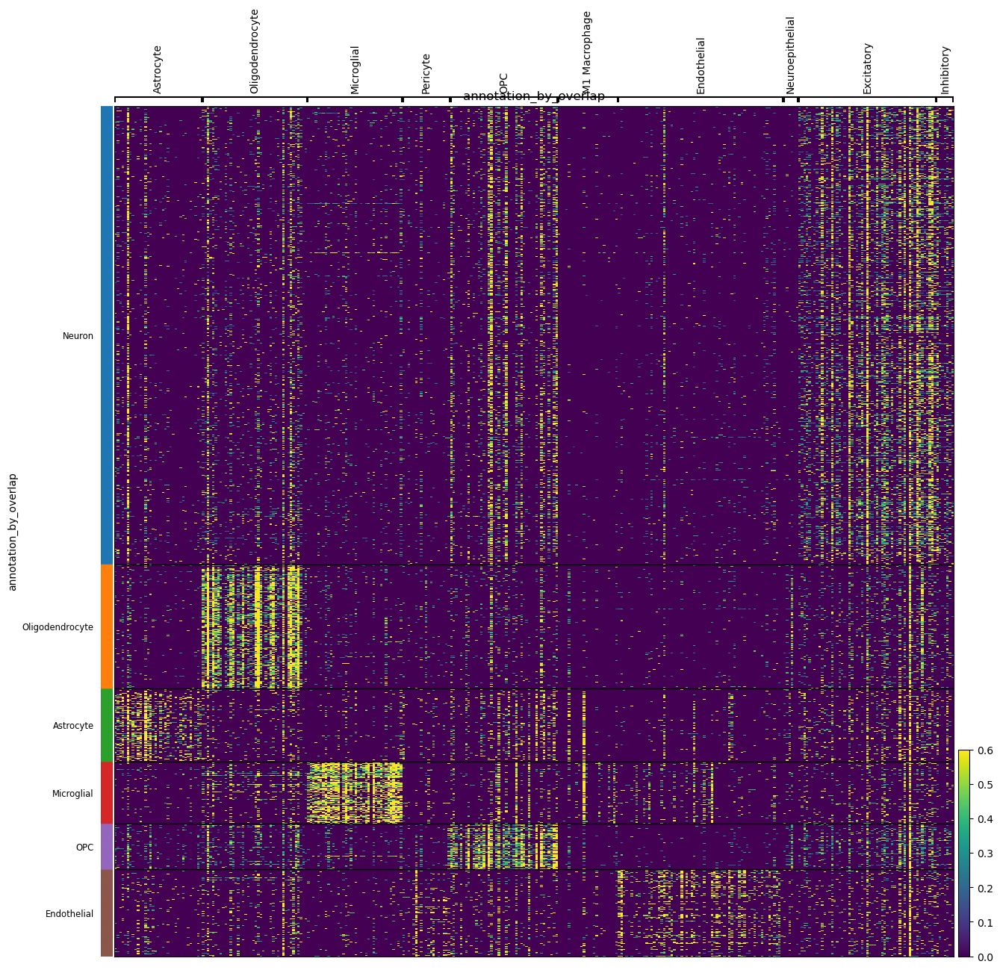

annotation_by_overlap
Neuron             0.538956
Oligodendrocyte    0.146124
Endothelial        0.102207
Astrocyte          0.086116
Microglial         0.072696
OPC                0.053902
Name: proportion, dtype: float64


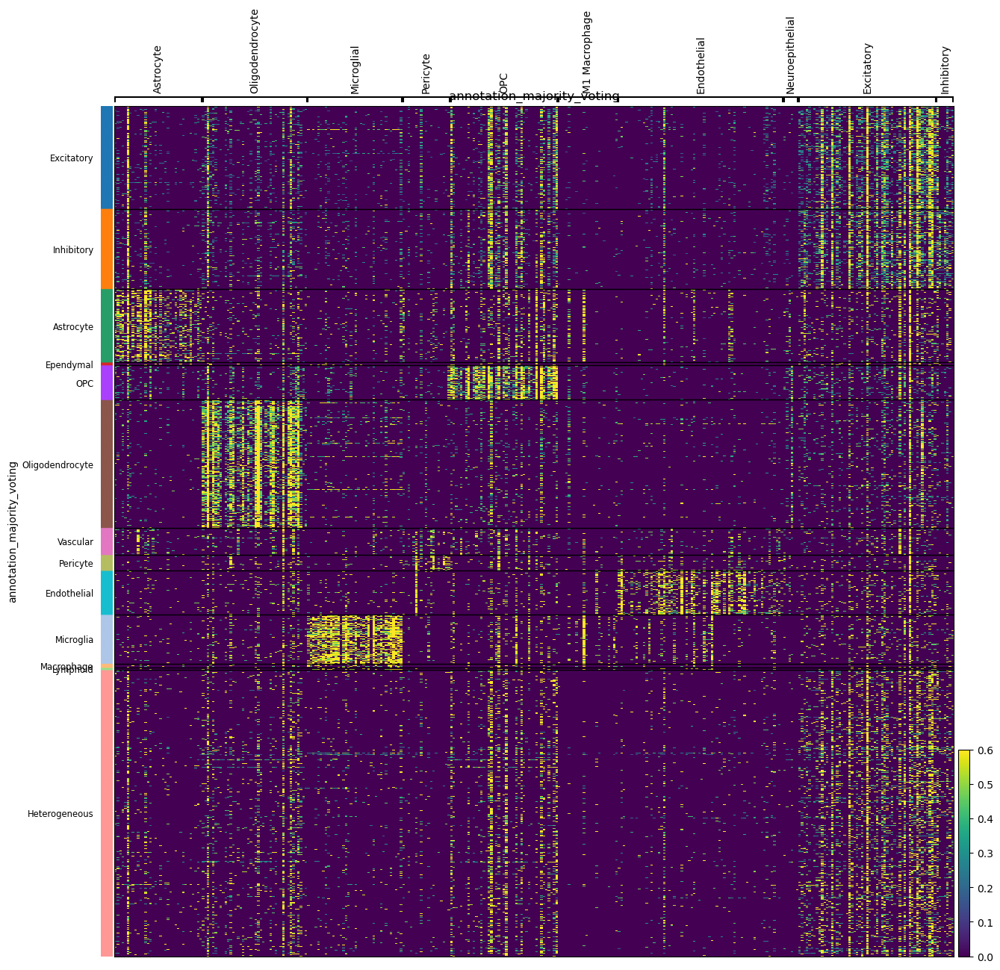

annotation_majority_voting
Heterogeneous      0.336641
Oligodendrocyte    0.150417
Excitatory         0.120906
Inhibitory         0.094289
Astrocyte          0.086370
Microglia          0.057559
Endothelial        0.051739
OPC                0.040737
Vascular           0.031832
Pericyte           0.018572
Macrophage         0.004802
Ependymal          0.003403
Lymphoid           0.002735
Name: proportion, dtype: float64


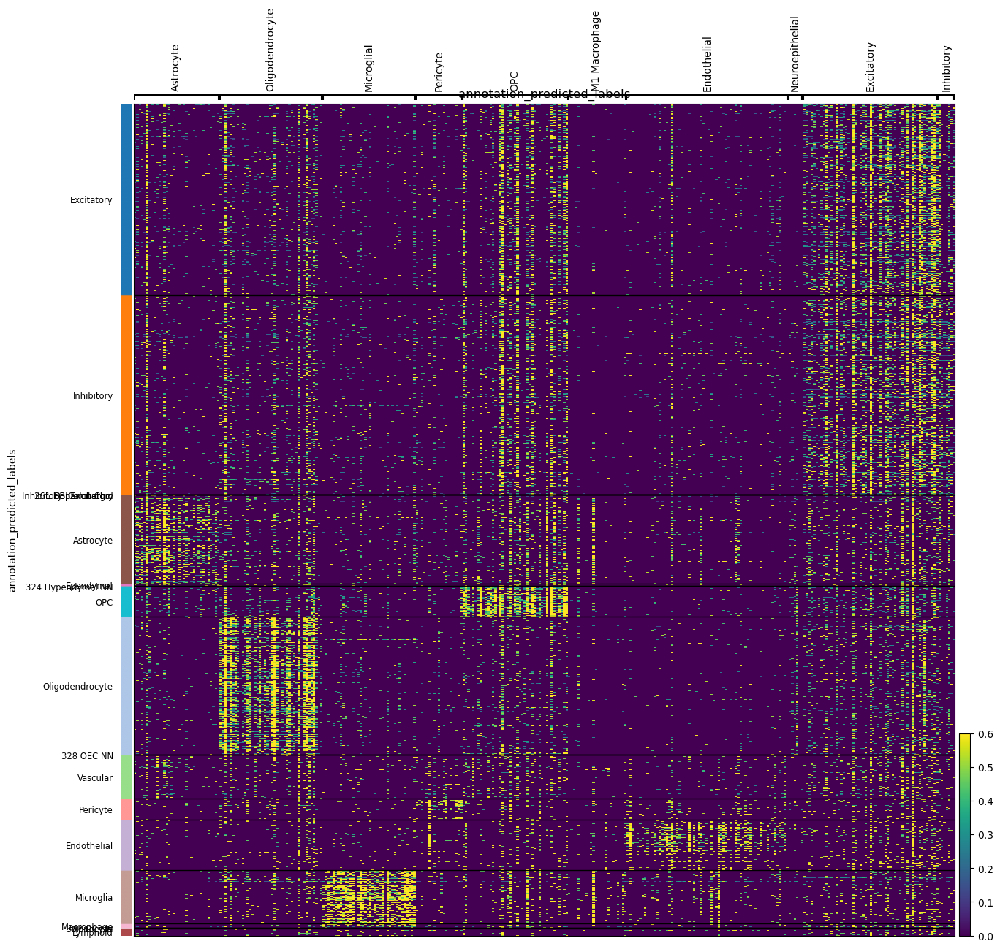

annotation_predicted_labels
Inhibitory                 0.239903
Excitatory                 0.230236
Oligodendrocyte            0.166380
Astrocyte                  0.106850
Microglia                  0.064110
Endothelial                0.060612
Vascular                   0.052566
OPC                        0.036507
Pericyte                   0.025440
Lymphoid                   0.008427
Macrophage                 0.005342
Ependymal                  0.002703
337 DC NN                  0.000382
Inhibitory | Excitatory    0.000127
324 Hypendymal NN          0.000095
Dopaminergic               0.000095
328 OEC NN                 0.000095
Monocyte                   0.000095
261 HB Calcb Chol          0.000032
Name: proportion, dtype: float64


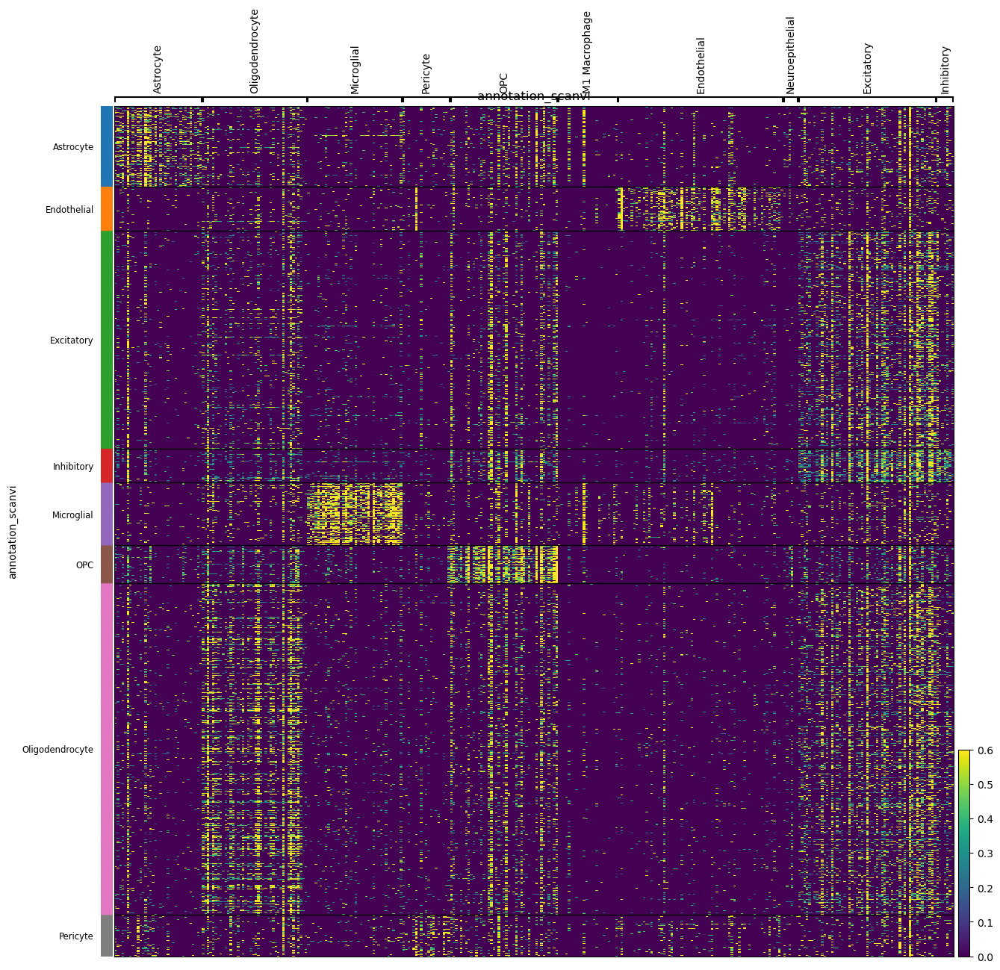

annotation_scanvi
Oligodendrocyte    0.389875
Excitatory         0.256153
Astrocyte          0.094829
Microglial         0.073650
Endothelial        0.051930
Pericyte           0.048877
OPC                0.044648
Inhibitory         0.040037
Name: proportion, dtype: float64


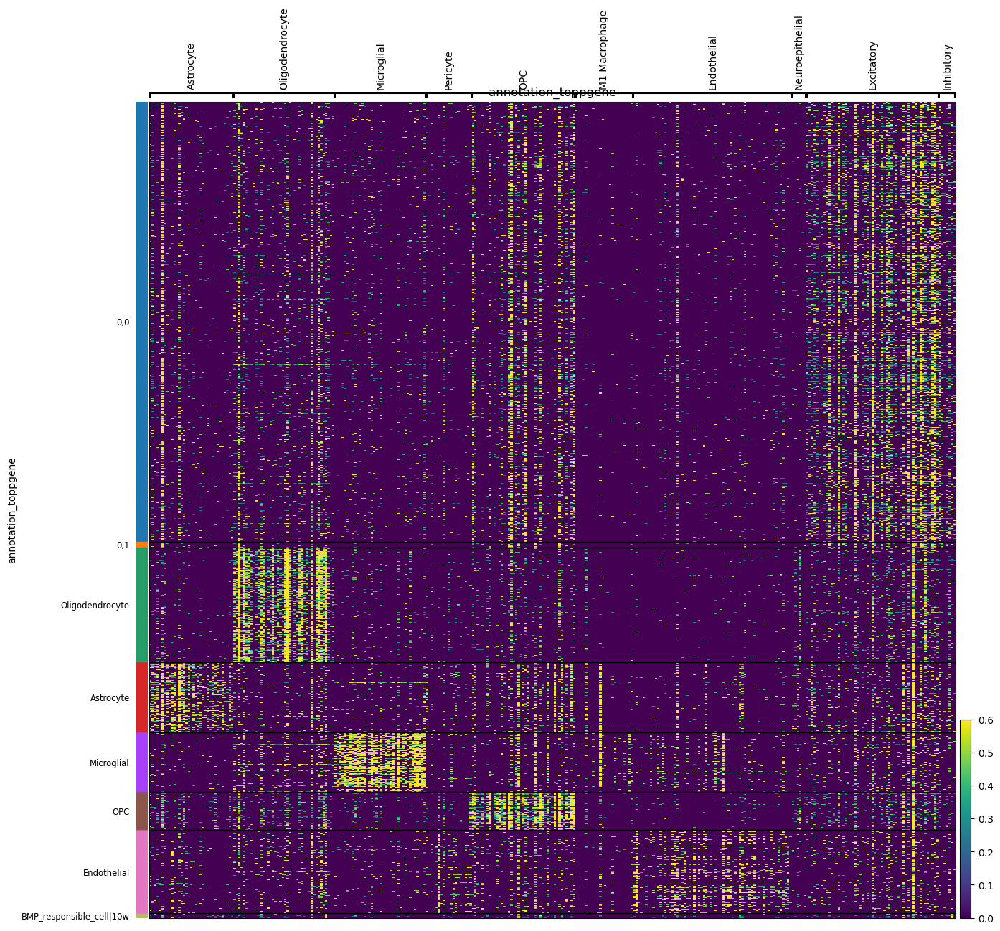

annotation_toppgene
0,0                         0.538956
Oligodendrocyte             0.140717
Endothelial                 0.102207
Astrocyte                   0.086116
Microglial                  0.072696
OPC                         0.046842
0,1                         0.007060
BMP_responsible_cell|10w    0.005406
Name: proportion, dtype: float64


annotation_by_overlap  annotation_majority_voting  annotation_predicted_labels  annotation_scanvi  annotation_toppgene     
Neuron                 Heterogeneous               Inhibitory                   Oligodendrocyte    0,0                         13.8
                       Excitatory                  Excitatory                   Excitatory         0,0                         13.1
                       Heterogeneous               Excitatory                   Oligodendrocyte    0,0                         11.1
                                                   Inhibitory                   Excitatory         0,0                         10.1
                                                   Excitatory                   Excitatory         0,0                          9.8
                       Inhibitory                  Inhibitory                   Oligodendrocyte    0,0                          7.3
                       Excitatory                  Excitatory                   Olig

In [61]:
cols = ["annotation_by_overlap",
        "annotation_majority_voting",
        "annotation_predicted_labels",
        "annotation_scanvi",
        "annotation_toppgene"]
# cols += [i for i in [
#     "cellmap_class_name", "cellmap_subclass_name"] if i in self.rna.obs]
cols = [i for i in cols if i in self.rna.obs]

# Plot UMAPs
_ = self.plot(kind="umap", col_wrap=3, color=cols, wspace=0.3)

# Plot Markers
if markers_predefined is not None:
    mks_c = dict(zip(markers_predefined, [markers_predefined[x].intersection(
           self.rna.var_names) for x in markers_predefined]))
    mks_c["Inhibitory"] = mks_c["Inhibitory"].difference(mks_c["Excitatory"])
    mks_c["Excitatory"] = mks_c["Excitatory"].difference(mks_c["Inhibitory"])
    for x in cols:
        fig = self.plot(genes=mks_c, figsize=(15, 15), vmax=0.6,
                        title=x, col_celltype=x,
                        layer="log1p", standard_scale="obs", kind="heat")
        print(self.rna.obs[x].value_counts(normalize=True))

# Compare
self.rna.obs[cols].groupby(cols[0]).apply(
        lambda x: round(100 * x.value_counts(normalize=True), 1).sort_index(
                ).sort_values(ascending=False), include_groups=False)

# Final Write

In [62]:
# Write h5ad
# self.rna.X = self.rna.layers["counts"].copy()
if overwrite is True or not os.path.exists(file_new):
    print("\n\n", f"Writing file to {file_new}...")
    self.rna.write_h5ad(file_new)

## Write Version Compatible with Older Packages
# adata = self.rna.copy()
# adata.uns = {}
# # adata.write_h5ad(os.path.splitext(file_new)[0] + "_compatible.h5ad")

# Send Email with Output When Done
if email is not None and html_out is not None:
    os.system(f"jupyter nbconvert --to html {cur_file}")
    os.system(f"echo 'yay' | mutt -s 'JOB DONE' -a {html_out} -- {email}")



 Writing file to data/SRR23052428_SRR23052429_integrated.h5ad...
